Part (a) Implementing Logistic Regression

Data Processing

In [51]:
import pandas as pd
import numpy as np

data = pd.read_csv('./Heart Disease.csv')

# Pre Processing the data where certain rows have NaNs.

columns_na = data.columns[data.isna().any()].tolist()
print("Columns with NaN values:", columns_na)

Columns with NaN values: ['education', 'cigsPerDay', 'BPMeds', 'totChol', 'BMI', 'heartRate', 'glucose']


In [52]:
# So, we need to deal with all the entries having NaN values for each of the 7 features above.

# print(data['education'].isna().sum()) # Code for checking how many entries have NaN values
mode = data['education'].mode().iloc[0]
data['education'] = data['education'].fillna(mode) # Filling with mode, as that makes most sense given the feature can have only 4 values

# print(data['cigsPerDay'].isna().sum()) Too few entries to warrant keeping, plus very important feature, so don't want to replace with something like mean, as it could skew the results

# print(data['BPMeds'].isna().sum())
mode = data['BPMeds'].mode().iloc[0]
data['BPMeds'] = data['BPMeds'].fillna(mode) # Filling with mode, as that makes most sense given the feature can have only 2 values

# print(data['totChol'].isna().sum()) Too few entries to warrant keeping, plus very important feature, so don't want to replace with something like mean, as it could skew the results

# print(data['BMI'].isna().sum()) Too few entries to warrant keeping, plus very important feature, so don't want to replace with something like mean, as it could skew the results

# print(data['heartRate'].isna().sum()) Too few entries to warrant keeping, plus very important feature, so don't want to replace with something like mean, as it could skew the results

# print(data['glucose'].isna().sum())
mean = data['glucose'].mean() # Filling with mean since it's a continuous data type
data['glucose'] = data['glucose'].fillna(mean)

data = data.dropna(subset=['cigsPerDay', 'BMI', 'heartRate', 'totChol']) # Dropping the rows having NaNs, as discussed before

In [53]:
# Shuffling the data and splitting it into train:val:test in a 70:15:15 ratio
data = data.sample(frac=1, random_state=19)
train_split = int(0.7 * len(data))
test_split = int(0.85 * len(data))

train = data[:train_split]
test = data[train_split:test_split]
val = data[test_split:]

Training the Model

In [54]:
# Default learning_rate set at 0.0001 as too high, and model could oscillate.
def grad_descent(train, val, learning_rate = 0.0001, epochs = 2500):
    # There are 16 weights in total as there are 15 features, so xb is a multiplication
    # of a 1*16 with a 16*1 matrix where b = transpose of [b1, b2, b3, ..., b16] and x = [x1, x2, x3, ..., x15, 1] and so,
    # o = x1b1 + x2b2 + ... + x15b15 + b16

    n_features = train.shape[1] - 1
    b_arr = [0 for i in range(n_features + 1)] # Initializing the weights with a small value as with larger number, xb could
                                               # become too large, leading to log(p) tending to infinity.


    # Splitting train and val dataset into x and y
    x_train = train.iloc[:, :n_features]
    y_train = train.iloc[:, n_features:]
    x_matrix = x_train.to_numpy()
    y_matrix = y_train.to_numpy()

    x_val = val.iloc[:, :n_features]
    y_val = val.iloc[:, n_features:]
    x_val_mat = x_val.to_numpy()
    y_val_mat = y_val.to_numpy()

    n_entries = x_matrix.shape[0]
    val_entries = x_val_mat.shape[0]

    # Adding a column of 1s to the end of the feature matrix, as that column will be multiplying with the constant in the eq. above.
    ones_column = np.ones((n_entries, 1))
    x_matrix = np.hstack((x_matrix, ones_column))

    ones_column = np.ones((val_entries, 1))
    x_val_mat = np.hstack((x_val_mat, ones_column))
    
    # tot_loss = 0

    # Pre-computing matrices needed later.
    xb_matrix = np.matmul(x_matrix, b_arr) # xb
    pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T # Sigmoid = p(xi)

    # for i in range(n_entries):
    #     if y_matrix.item((i,0)) == 1:
    #         tot_loss += (-1) * np.log(pxi_matrix.item((i,0))) # loss is -log(p)
    #     else:
    #         tot_loss += (-1) * np.log(1 - pxi_matrix.item((i,0))) # loss is -log(1-p)

    # print(f"Training Loss at the start of the process -> {tot_loss / n_entries}") # Calculating total loss without training, i.e. 0th iteration

    # Finding initial val loss, for future comparison, for stopping the gradient descent.
    # tot_loss = 0
    # n_acc = 0
    # val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
    # val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

    # for i in range(val_entries):
    #     if y_val_mat.item((i,0)) == 1:
    #         tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
    #     else:
    #         tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)

    # curr_min = tot_loss / val_entries
    # prev_min = curr_min + 1

    n_iter = 0

    loss_arr_train = []
    loss_arr_val = []
    accuracy_train = []
    accuracy_val = []

    # best_b_arr = b_arr

    # while True:
    for i in range(epochs):
        # if n_iter % 1000 == 0:
        #     if curr_min >= prev_min - 0.0005:
        #         print("Gradient not descending sufficiently anymore. Stopping.")
        #         break
        #     prev_min = curr_min


        # For performing gradient descent, we need to compute the gradient of the loss function with respect to the parameters.
        # That gradient = -(y - h(xb))x where h is the sigmoid function. The following line calculate this gradient, utilizing
        # (y-h(xb)) calculated previously already.

        curr_step = y_matrix - pxi_matrix # y - h(xb), (h(xi_b) = p(xi))

        grad_mat = x_matrix.copy()

        for i in range(n_entries):
            grad_mat[i,:] *= curr_step.item((i,0)) # (y - h(xb)) * x

        # x_copy now has the negative gradient and to compute the new parameters after 1 iteration, for any arbitrary parameter b_i,
        # b_i_new = b_i_old - (gradient) = b_i_old + (y - h(xb)) * x. In batch gradient descent, we take average of all the gradients obtained
        # and then update the weights.

        avg_gradient = np.mean(grad_mat, axis = 0) # Calculating avg gradients for all the weights.
        avg_gradient *= learning_rate # Multiplying by learning rate
        if np.all(avg_gradient == 0):
            return loss_arr_train, loss_arr_val, accuracy_train, accuracy_val, n_iter, b_arr # If gradient is 0, stop
        
        b_arr = b_arr + avg_gradient # Updating Weights

        # Finding cross entropy loss and accuracy for train set
        tot_loss = 0
        n_acc = 0
        xb_matrix = np.matmul(x_matrix, b_arr) # xb
        pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T # Sigmoid = p(xi)

        for i in range(n_entries):
            if y_matrix.item((i,0)) == 1:
                tot_loss += (-1) * np.log(pxi_matrix.item((i,0))) # loss is -log(p)
                if pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - pxi_matrix.item((i,0))) # loss is -log(1-p)
                if pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        print(f"\nTraining Loss at iteration {n_iter+1} -> {tot_loss / n_entries}")
        loss_arr_train.append(tot_loss / n_entries)
        accuracy_train.append(round((n_acc / n_entries) * 100, 2))
        print(f"Training Accuracy at iteration {n_iter+1} -> {round((n_acc / n_entries) * 100, 2)}%\n")

        # Finding cross entropy loss and accuracy for val set

        tot_loss = 0
        n_acc = 0
        val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
        val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

        for i in range(val_entries):
            if y_val_mat.item((i,0)) == 1:
                tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
                if val_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)
                if val_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        # if tot_loss / val_entries <= curr_min:
        #     curr_min = tot_loss / val_entries
        #     best_b_arr = b_arr # On exiting from gradient descent, the parameters that had the best val loss, are returned.
        print(f"Val Loss at iteration {n_iter+1} -> {tot_loss / val_entries}")
        loss_arr_val.append(tot_loss / val_entries)
        accuracy_val.append(round((n_acc / val_entries) * 100, 2))
        print(f"Val Accuracy at iteration {n_iter+1} -> {round((n_acc / val_entries) * 100, 2)}%\n")

        n_iter+=1

    return loss_arr_train, loss_arr_val, accuracy_train, accuracy_val, n_iter, b_arr

loss_arr_train, loss_arr_val, accuracy_train, accuracy_val, n_iter, b_arr = grad_descent(train, val)


Training Loss at iteration 1 -> 0.5630807504698082
Training Accuracy at iteration 1 -> 84.75%

Val Loss at iteration 1 -> 0.6032670398505281
Val Accuracy at iteration 1 -> 83.74%


Training Loss at iteration 2 -> 0.45475657866795627
Training Accuracy at iteration 2 -> 84.75%

Val Loss at iteration 2 -> 0.4792581681601733
Val Accuracy at iteration 2 -> 83.74%


Training Loss at iteration 3 -> 0.4431045896246552
Training Accuracy at iteration 3 -> 84.75%

Val Loss at iteration 3 -> 0.46113349989823316
Val Accuracy at iteration 3 -> 83.74%


Training Loss at iteration 4 -> 0.44292935539114636
Training Accuracy at iteration 4 -> 84.75%

Val Loss at iteration 4 -> 0.4616044453971419
Val Accuracy at iteration 4 -> 83.74%


Training Loss at iteration 5 -> 0.4428529120672469
Training Accuracy at iteration 5 -> 84.75%

Val Loss at iteration 5 -> 0.4612484716821253
Val Accuracy at iteration 5 -> 83.74%


Training Loss at iteration 6 -> 0.44278568866370627
Training Accuracy at iteration 6 -> 84.

Training Loss

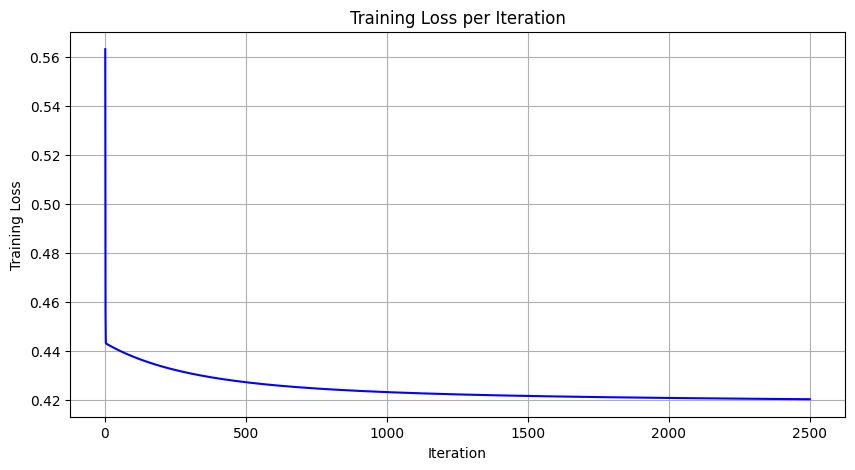

In [55]:
import matplotlib.pyplot as plt

iterations = [i for i in range(1, n_iter + 1)]  # Iteration numbers


# Training loss
plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_train, linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Training Loss')
plt.title('Training Loss per Iteration')
plt.grid(True)
plt.show()


Val Loss

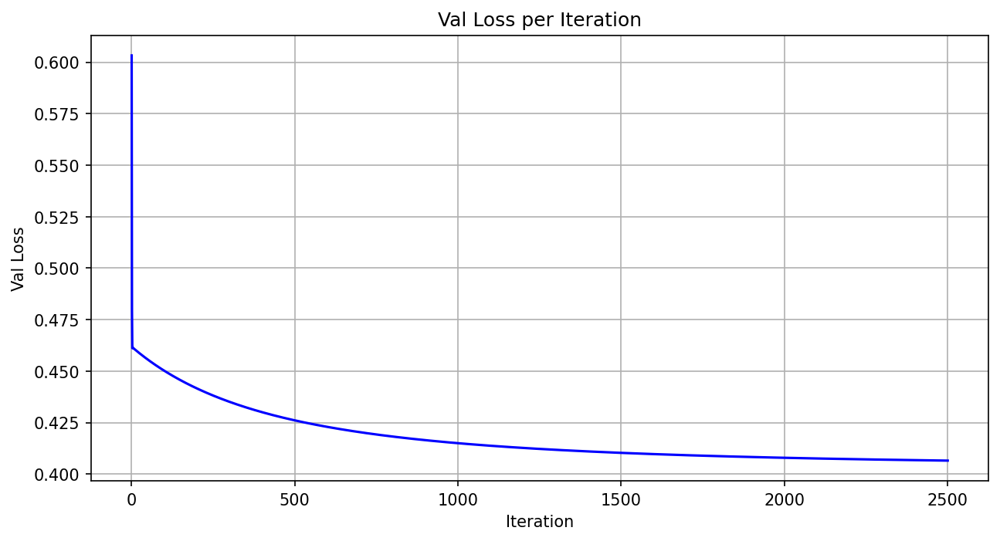

In [56]:
plt.figure(figsize=(10,5), dpi = 150)
plt.plot(iterations, loss_arr_val, linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Val Loss')
plt.title('Val Loss per Iteration')
plt.grid(True)
plt.show()

# plt.figure(figsize=(10,5), dpi = 150)
# plt.plot(iterations, loss_arr_val, linestyle='-', color='b')
# plt.xlabel('Iteration')
# plt.ylabel('Val Loss')
# plt.title('Val Loss per Iteration (With X Axis in Log Scale)')
# plt.xscale('log')
# plt.grid(True)
# plt.show()

Comparing the 2 Losses

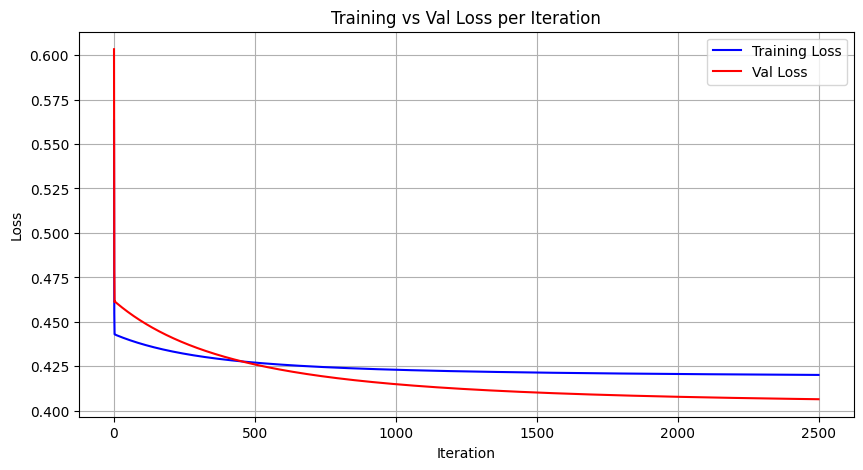

In [57]:
plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_train, linestyle='-', color='b', label = 'Training Loss')
plt.plot(iterations, loss_arr_val, linestyle='-', color='r', label = 'Val Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training vs Val Loss per Iteration')
plt.grid(True)
plt.legend()
plt.show()

# plt.figure(figsize=(10,5))
# plt.plot(iterations, loss_arr_train, linestyle='-', color='b', label = 'Training Loss')
# plt.plot(iterations, loss_arr_val, linestyle='-', color='r', label = 'Val Loss')
# plt.xlabel('Iteration')
# plt.ylabel('Loss')
# plt.xscale('log')
# plt.title('Training vs Val Loss per Iteration (With log scaling on X axis)')
# plt.grid(True)
# plt.legend()
# plt.show()

Training Accuracy

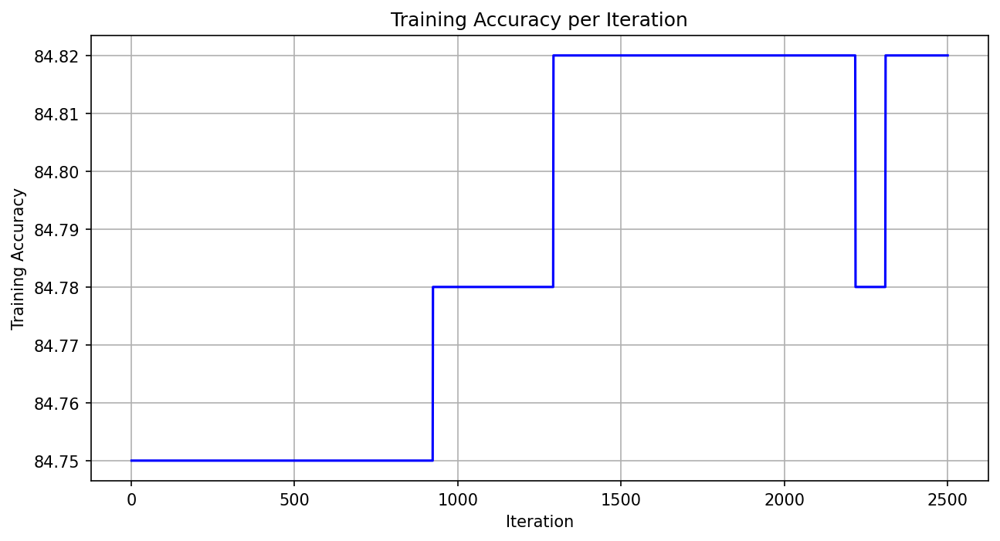

In [58]:
plt.figure(figsize=(10,5), dpi = 150)
plt.plot(iterations, accuracy_train, linestyle='-', color='b')
# plt.ylim(83, 86)
plt.xlabel('Iteration')
plt.ylabel('Training Accuracy')
plt.title('Training Accuracy per Iteration')
plt.grid(True)
plt.show()

Val Accuracy

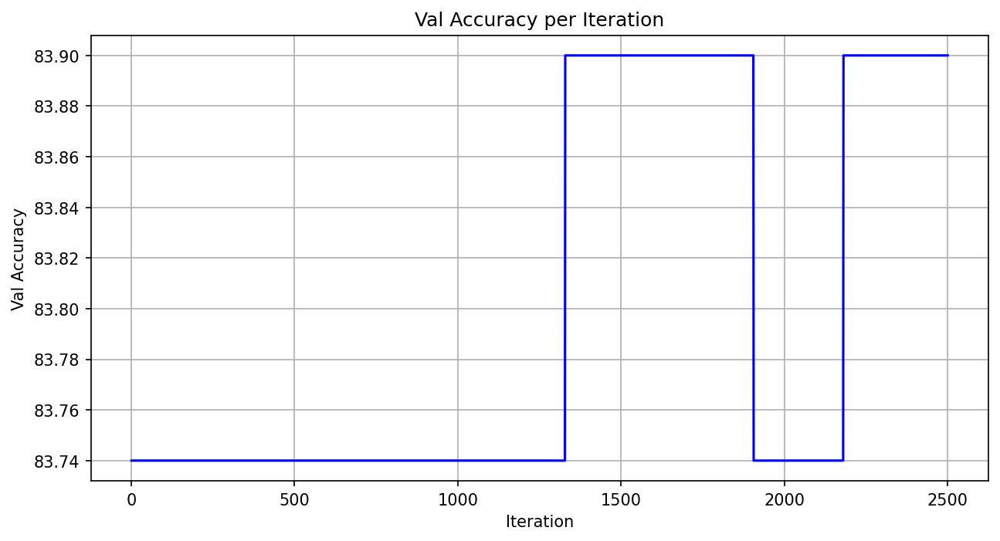

In [59]:
plt.figure(figsize=(10,5), dpi = 150)
plt.plot(iterations, accuracy_val, linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Val Accuracy')
plt.title('Val Accuracy per Iteration')
plt.grid(True)
plt.show()

Comparing Training Accuracy and Val Accuracy

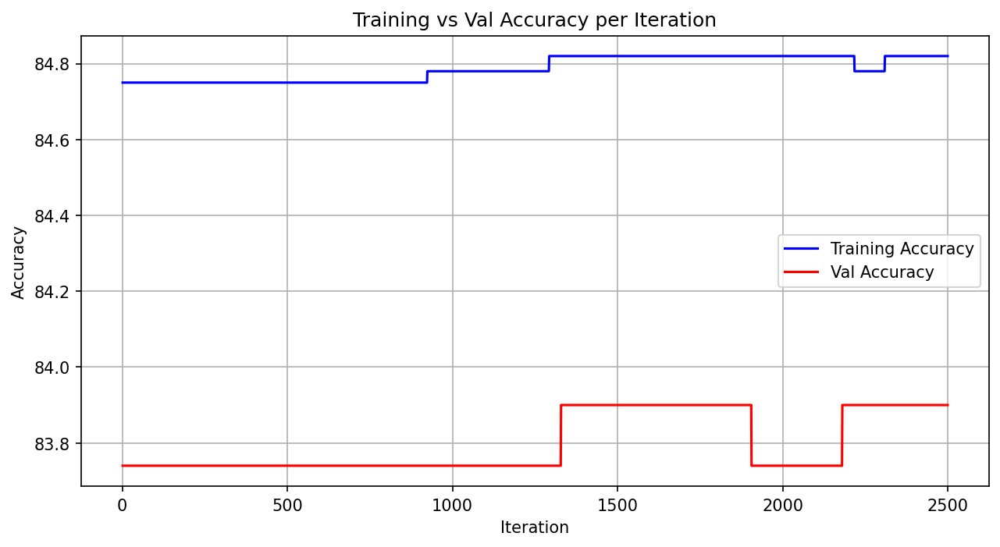

In [60]:
plt.figure(figsize=(10,5), dpi = 150)
plt.plot(iterations, accuracy_train, linestyle='-', color='b', label = 'Training Accuracy')
plt.plot(iterations, accuracy_val, linestyle='-', color='r', label = 'Val Accuracy')
plt.xlabel('Iteration')
plt.ylabel('Accuracy')
plt.title('Training vs Val Accuracy per Iteration')
plt.grid(True)
plt.legend()
plt.show()

Convergence :- The model converges after 2000 iterations in terms of val loss and also doesn’t have much shifts in the accuracy over time. 

Comparison of Plots :- Generally, training loss should be better than val loss, but in this case the val loss gets better after the initial stages of training. This indicates an imbalance in the splitting of data, or that the model in general isn’t overfitting at all, which is a very good sign. In terms of the accuracy, the val accuracy is about 1% less than train accuracy which is normal.

Analysis :- The model decreases pretty quickly and doesn’t seem to be overfitting. Even after 2000 iterations, the loss decreases, so the gradient isn’t quite at 0 yet, but small enough.


--------------------------------------------------------------------------------------------

PART (b) -> Feature Scaling Analysis

In [61]:
featured_scaled_data = data.copy(deep=True) # Creating deep copy of original data
f_columns_list = featured_scaled_data.columns.tolist()
f_columns_list.remove('HeartDisease')

# For every entry in a row, the entry xi = (xi-xmin) / (xmax-xmin)
for column in f_columns_list:
    featured_scaled_data[column] = (featured_scaled_data[column] - featured_scaled_data[column].min()) / (featured_scaled_data[column].max() - featured_scaled_data[column].min())

train_scaled = featured_scaled_data[:train_split]
test_scaled = featured_scaled_data[train_split:test_split]
val_scaled = featured_scaled_data[test_split:]

scale_loss_train, scale_loss_val, tmp1, tmp2, n_iter2, b_arr_scaled = grad_descent(train_scaled, val_scaled, learning_rate = 0.0001)


Training Loss at iteration 1 -> 0.6931218438726173
Training Accuracy at iteration 1 -> 84.75%

Val Loss at iteration 1 -> 0.6931222090047598
Val Accuracy at iteration 1 -> 83.74%


Training Loss at iteration 2 -> 0.69309651013326
Training Accuracy at iteration 2 -> 84.75%

Val Loss at iteration 2 -> 0.6930972404082839
Val Accuracy at iteration 2 -> 83.74%


Training Loss at iteration 3 -> 0.6930711793415251
Training Accuracy at iteration 3 -> 84.75%

Val Loss at iteration 3 -> 0.6930722747701669
Val Accuracy at iteration 3 -> 83.74%


Training Loss at iteration 4 -> 0.6930458514970687
Training Accuracy at iteration 4 -> 84.75%

Val Loss at iteration 4 -> 0.6930473120900552
Val Accuracy at iteration 4 -> 83.74%


Training Loss at iteration 5 -> 0.6930205265995394
Training Accuracy at iteration 5 -> 84.75%

Val Loss at iteration 5 -> 0.6930223523676008
Val Accuracy at iteration 5 -> 83.74%


Training Loss at iteration 6 -> 0.692995204648594
Training Accuracy at iteration 6 -> 84.75%

Va

Training Loss

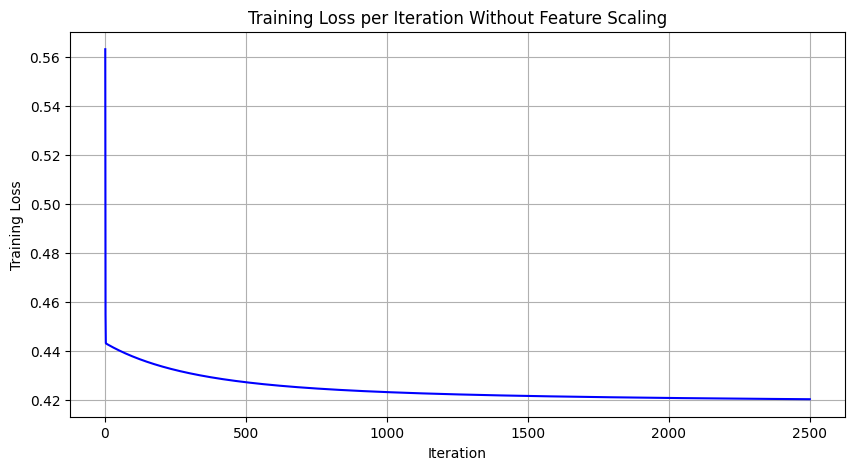

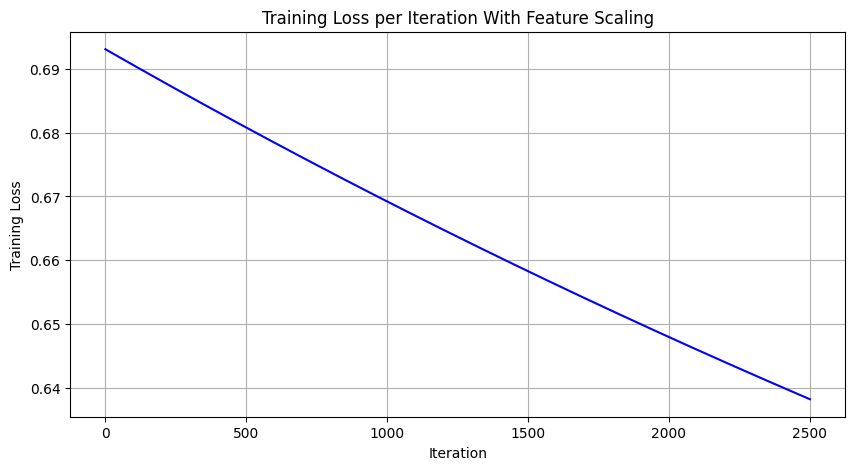

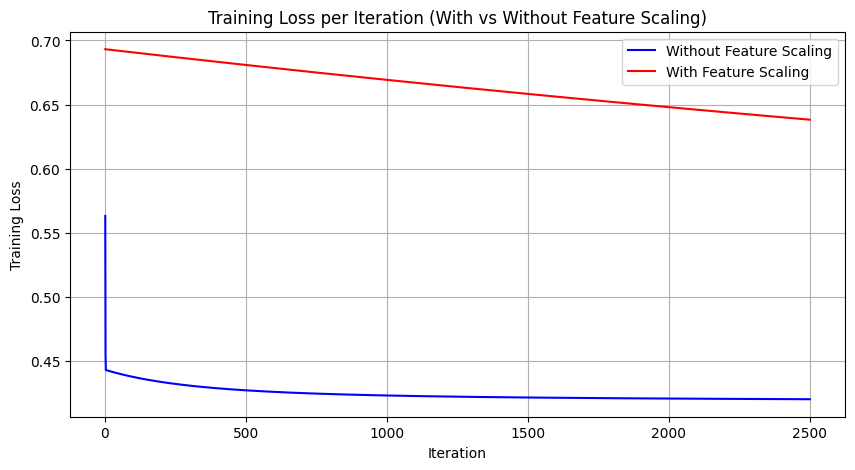

In [62]:
iterations = [i for i in range(1, n_iter + 1)]  # Iteration numbers
iterations2 = [i for i in range(1, n_iter2 + 1)]


# Training loss without feature scaling
plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_train, linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Training Loss')
plt.title('Training Loss per Iteration Without Feature Scaling')
plt.grid(True)
plt.show()

# Training loss with feature scaling
plt.figure(figsize=(10,5))
plt.plot(iterations2, scale_loss_train, linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Training Loss')
plt.title('Training Loss per Iteration With Feature Scaling')
plt.grid(True)
plt.show()

# Comparing the two
plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_train, linestyle='-', color='b', label = 'Without Feature Scaling')
plt.plot(iterations2, scale_loss_train, linestyle='-', color='r', label = 'With Feature Scaling')
plt.xlabel('Iteration')
plt.ylabel('Training Loss')
plt.title('Training Loss per Iteration (With vs Without Feature Scaling)')
plt.legend()
plt.grid(True)
plt.show()

Val Loss

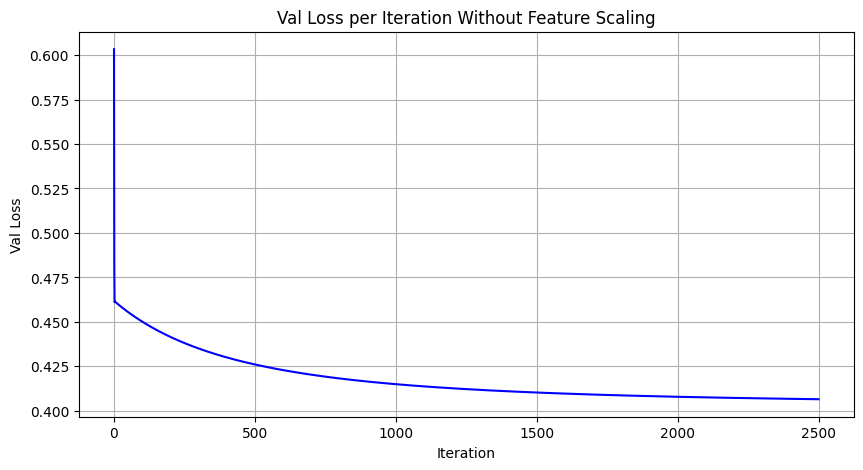

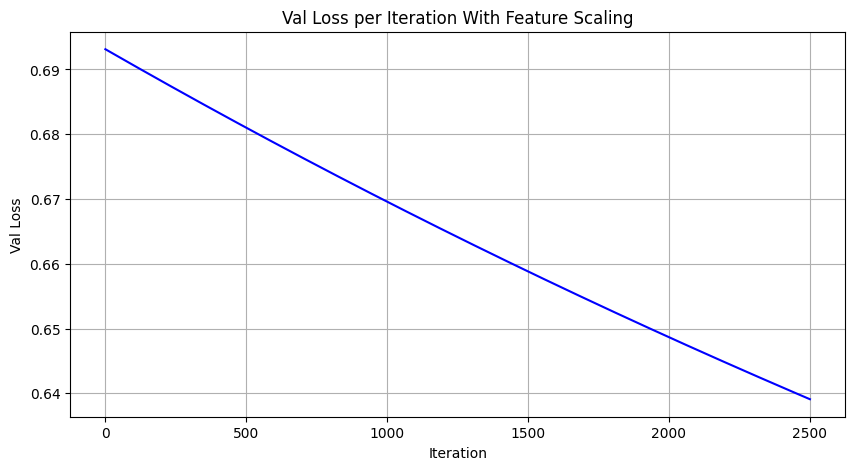

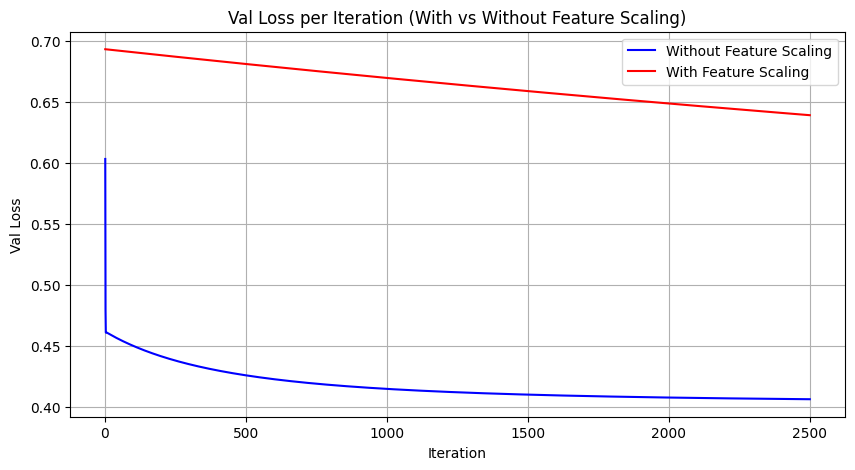

In [63]:
# Val loss without feature scaling
plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_val, linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Val Loss')
plt.title('Val Loss per Iteration Without Feature Scaling')
plt.grid(True)
plt.show()

# Val loss with feature scaling
plt.figure(figsize=(10,5))
plt.plot(iterations2, scale_loss_val, linestyle='-', color='b')
plt.xlabel('Iteration')
plt.ylabel('Val Loss')
plt.title('Val Loss per Iteration With Feature Scaling')
plt.grid(True)
plt.show()

# Comparing the two
plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_val, linestyle='-', color='b', label = 'Without Feature Scaling')
plt.plot(iterations2, scale_loss_val, linestyle='-', color='r', label = 'With Feature Scaling')
plt.xlabel('Iteration')
plt.ylabel('Val Loss')
plt.title('Val Loss per Iteration (With vs Without Feature Scaling)')
plt.legend()
plt.grid(True)
plt.show()

In [64]:
# Displaying effects with different learning rate of 1

tl1, vl1, ta1, va1, n1, b1 = grad_descent(train_scaled, val_scaled, learning_rate = 1, epochs = 2500)
tl2, vl2, ta2, va2, n2, b2 = grad_descent(train, val, learning_rate=1, epochs = 2500)


Training Loss at iteration 1 -> 0.5115280690266543
Training Accuracy at iteration 1 -> 84.75%

Val Loss at iteration 1 -> 0.5166199098143233
Val Accuracy at iteration 1 -> 83.74%


Training Loss at iteration 2 -> 0.47168090911806154
Training Accuracy at iteration 2 -> 84.75%

Val Loss at iteration 2 -> 0.4798429950384849
Val Accuracy at iteration 2 -> 83.74%


Training Loss at iteration 3 -> 0.4583372698312094
Training Accuracy at iteration 3 -> 84.75%

Val Loss at iteration 3 -> 0.46824865799627857
Val Accuracy at iteration 3 -> 83.74%


Training Loss at iteration 4 -> 0.4523438690449649
Training Accuracy at iteration 4 -> 84.75%

Val Loss at iteration 4 -> 0.46328812911654565
Val Accuracy at iteration 4 -> 83.74%


Training Loss at iteration 5 -> 0.4489253307923434
Training Accuracy at iteration 5 -> 84.75%

Val Loss at iteration 5 -> 0.4604876251490395
Val Accuracy at iteration 5 -> 83.74%


Training Loss at iteration 6 -> 0.4465487292240352
Training Accuracy at iteration 6 -> 84.7

C:\Users\Abhirup Das\AppData\Local\Temp\ipykernel_4400\2978692014.py:106: RuntimeWarning: overflow encountered in exp
  pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T # Sigmoid = p(xi)
C:\Users\Abhirup Das\AppData\Local\Temp\ipykernel_4400\2978692014.py:110: RuntimeWarning: divide by zero encountered in log
  tot_loss += (-1) * np.log(pxi_matrix.item((i,0))) # loss is -log(p)
C:\Users\Abhirup Das\AppData\Local\Temp\ipykernel_4400\2978692014.py:128: RuntimeWarning: overflow encountered in exp
  val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)
C:\Users\Abhirup Das\AppData\Local\Temp\ipykernel_4400\2978692014.py:132: RuntimeWarning: divide by zero encountered in log
  tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
C:\Users\Abhirup Das\AppData\Local\Temp\ipykernel_4400\2978692014.py:114: RuntimeWarning: divide by zero encountered in log
  tot_loss += (-1) * np.log(1 - pxi_matrix.item(


Training Loss at iteration 11 -> inf
Training Accuracy at iteration 11 -> 84.75%

Val Loss at iteration 11 -> inf
Val Accuracy at iteration 11 -> 83.74%


Training Loss at iteration 12 -> inf
Training Accuracy at iteration 12 -> 84.75%

Val Loss at iteration 12 -> inf
Val Accuracy at iteration 12 -> 83.74%


Training Loss at iteration 13 -> inf
Training Accuracy at iteration 13 -> 84.75%

Val Loss at iteration 13 -> inf
Val Accuracy at iteration 13 -> 83.74%


Training Loss at iteration 14 -> inf
Training Accuracy at iteration 14 -> 84.75%

Val Loss at iteration 14 -> inf
Val Accuracy at iteration 14 -> 83.74%


Training Loss at iteration 15 -> inf
Training Accuracy at iteration 15 -> 84.75%

Val Loss at iteration 15 -> inf
Val Accuracy at iteration 15 -> 83.74%


Training Loss at iteration 16 -> inf
Training Accuracy at iteration 16 -> 15.25%

Val Loss at iteration 16 -> inf
Val Accuracy at iteration 16 -> 16.26%


Training Loss at iteration 17 -> inf
Training Accuracy at iteration 1

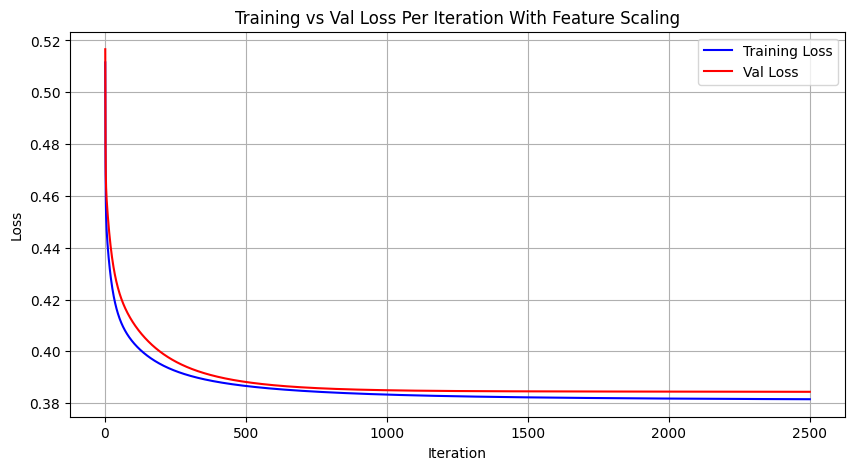

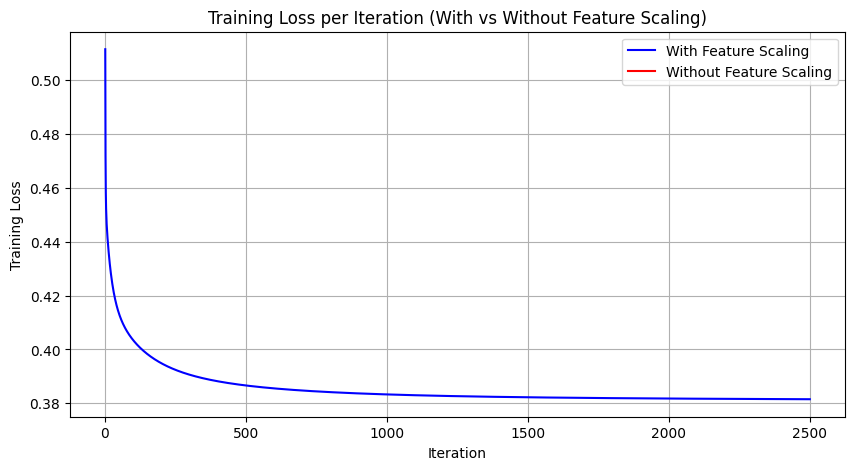

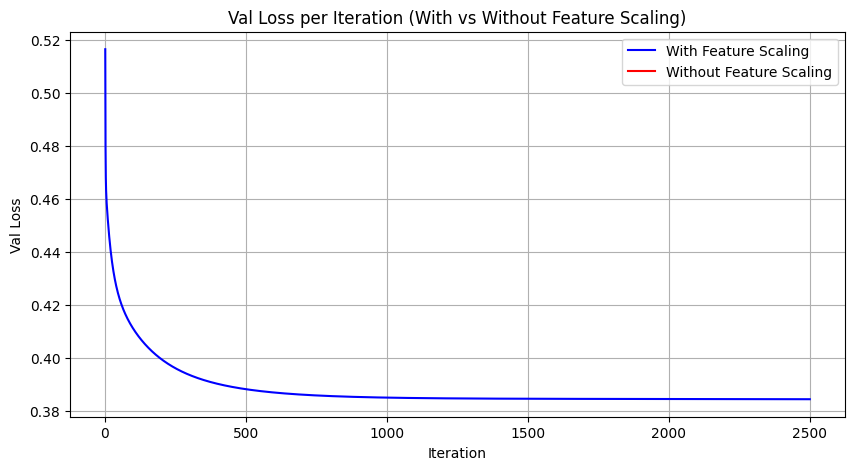

In [65]:
iterations = [i for i in range(1, n1+1)]
iterations2 = [i for i in range(1, n2+1)]

plt.figure(figsize=(10,5))
plt.plot(iterations, tl1, linestyle='-', color='b', label = 'Training Loss')
plt.plot(iterations, vl1, linestyle='-', color='r', label = 'Val Loss')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training vs Val Loss Per Iteration With Feature Scaling')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, tl1, linestyle='-', color='b', label = 'With Feature Scaling')
plt.plot(iterations2, tl2, linestyle='-', color='r', label = 'Without Feature Scaling')
plt.xlabel('Iteration')
plt.ylabel('Training Loss')
plt.title('Training Loss per Iteration (With vs Without Feature Scaling)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, vl1, linestyle='-', color='b', label = 'With Feature Scaling')
plt.plot(iterations2, vl2, linestyle='-', color='r', label = 'Without Feature Scaling')
plt.xlabel('Iteration')
plt.ylabel('Val Loss')
plt.title('Val Loss per Iteration (With vs Without Feature Scaling)')
plt.legend()
plt.grid(True)
plt.show()

Impact of Feature Scaling -> With a low learning rate like 0.0001, the convergence in regular gradient descent is much faster. With feature scaling, the convergence is really slow with such a learning rate. But with a higher learning rate, the regular gradient descent is really bad, as there is extremely high oscillations due to the learning rate. So, convergence is horrible, in fact, it doesn’t converge. But, with a learning rate of 1 for feature scaling, the convergence is quick and leads to a better loss even. Even though the accuracies were so high in the past diagrams, yet these scores emerge, indicating that the imbalance in labels has led to the model not being particularly great.

Part (c) -> Metrics

In [66]:
from sklearn.metrics import roc_curve, roc_auc_score # Using sklearn only for ROC-AUC curve

# Using the best coefficients achieved before, during gradient descent, the confusion matrix is generated on the val set.
# We use the feature scaled model, as it has displayed better val loss at the end of 2500 epochs.
n_features = train_scaled.shape[1] - 1

x_val = val_scaled.iloc[:, :n_features]
y_val = val_scaled.iloc[:, n_features:]
x_val_mat = x_val.to_numpy()
y_val_mat = y_val.to_numpy()

val_entries = x_val_mat.shape[0]

ones_column = np.ones((val_entries, 1))
x_val_mat = np.hstack((x_val_mat, ones_column))

val_xb_matrix = np.matmul(x_val_mat, b1) # xb that too with the coefficients with the feature scaled model
val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

tp = 0
tn = 0
fp = 0
fn = 0

y_pred = []

for i in range(val_entries):
    if y_val_mat.item((i,0)) == 1:
        if val_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
            y_pred.append(1)
            tp += 1
        else:
            y_pred.append(0)
            fn += 1
    else:
        if val_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
            y_pred.append(0)
            tn += 1
        else:
            y_pred.append(1)
            fp += 1

y_pred = np.array(y_pred)

print(f'''Confusion Matrix:
                                        Predicted Class
                                    Heart Disease   No Heart Disease
Actual Class    Heart Disease            {tp}              {fn}
                No Heart Disease         {fp}              {tn}



''')

recall = tp / (tp + fn)
try:
    precision = tp / (tp + fp)
except:
    precision = -1

if precision == -1:
    print(f"Recall -> {recall}")
    print(f"Precision -> N.A.")
    print(f"ROC-AUC Score -> {roc_auc_score(y_val_mat, y_pred)}")
else:
    print(f"Recall -> {recall}")
    print(f"Precision -> {precision}")
    print(f"F1 Score -> {(2 * precision * recall) / (precision + recall)}")
    print(f"ROC-AUC Score -> {roc_auc_score(y_val_mat, y_pred)}")


# # ROC curve
# fpr, tpr, thresholds = roc_curve(y_val_mat, y_pred)
# plt.figure()
# plt.plot(fpr, tpr, color='blue', lw=2)
# plt.plot([0, 1], [0, 1], color='black', linestyle='--')
# plt.xlim([0.0, 1.0])
# plt.ylim([0.0, 1.05])
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic (ROC) Curve')
# plt.show()

Confusion Matrix:
                                        Predicted Class
                                    Heart Disease   No Heart Disease
Actual Class    Heart Disease            7              94
                No Heart Disease         5              515




Recall -> 0.06930693069306931
Precision -> 0.5833333333333334
F1 Score -> 0.12389380530973453
ROC-AUC Score -> 0.5298457730388424


With the feature scaling (learning rate = 1), the above metrics arise. This shows that there is a dramatic imbalance in the predictions, where the model predicts that the person doesn’t have heart disease most of the time. So, the recall is very low, which is very bad for a model that’s predicting heart disease(you don’t want to tell a person with a heart disease that he doesn’t have it but a false positive is comparatively better). The precision doesn’t really matter in this case, because there are so few cases where heart disease is predicted, but it’s still not great. The F1 Score and ROC-AUC Scores are horrible, which makes sense since the recall is really low, so overall it has really poor performance. The ROC-AUC scores should generally be above 0.9 to be a great model.



Part (d) Different Optimization Algorithms

In [80]:
# # Function for training with stochastic gradient descent
# def grad_descent_with_stochastic(train, val, test, learning_rate = 0.0001, epochs = 2500):
#     # There are 16 weights in total as there are 15 features, so xb is a multiplication
#     # of a 1*16 with a 16*1 matrix where b = transpose of [b1, b2, b3, ..., b16] and x = [x1, x2, x3, ..., x15, 1] and so,
#     # o = x1b1 + x2b2 + ... + x15b15 + b16

#     n_features = train.shape[1] - 1
#     b_arr = [0 for i in range(n_features + 1)] # Initializing the weights with a small value as with larger number, xb could
#                                                # become too large, leading to log(p) tending to infinity.


#     # Splitting train and val dataset into x and y
#     x_train = train.iloc[:, :n_features]
#     y_train = train.iloc[:, n_features:]
#     x_matrix = x_train.to_numpy()
#     y_matrix = y_train.to_numpy()

#     x_val = val.iloc[:, :n_features]
#     y_val = val.iloc[:, n_features:]
#     x_val_mat = x_val.to_numpy()
#     y_val_mat = y_val.to_numpy()

#     x_test = test.iloc[:, :n_features]
#     y_test = test.iloc[:, n_features:]
#     x_test_mat = x_test.to_numpy()
#     y_test_mat = y_test.to_numpy()

#     n_entries = x_matrix.shape[0]
#     val_entries = x_val_mat.shape[0]
#     test_entries = x_test_mat.shape[0]

#     # Adding a column of 1s to the end of the feature matrix, as that column will be multiplying with the constant in the eq. above.
#     ones_column = np.ones((n_entries, 1))
#     x_matrix = np.hstack((x_matrix, ones_column))

#     ones_column = np.ones((val_entries, 1))
#     x_val_mat = np.hstack((x_val_mat, ones_column))

#     ones_column = np.ones((test_entries, 1))
#     x_test_mat = np.hstack((x_test_mat, ones_column))
#     n_iter = 0

#     loss_arr_train = []
#     loss_arr_val = []
#     loss_arr_test = []
#     accuracy_train = []
#     accuracy_val = []
#     accuracy_test = []

#     for i in range(epochs):
#         for i in range(n_entries):
#             # For performing gradient descent, we need to compute the gradient of the loss function with respect to the parameters.
#             # That gradient = -(y - h(xb))x where h is the sigmoid function. The following line calculate this gradient, utilizing
#             # (y-h(xb)).

#             xb = np.matmul(x_matrix[i,:],b_arr)
#             pxi = (1 / (1 + np.exp((-1) * xb))) # Sigmoid = p(xi)
#             tmp = y_matrix.item((i,0)) - pxi # y - h(xb), (h(xi_b) = p(xi))
#             grad = x_matrix[i, :] * tmp # (y - h(xb)) * x

#             # grad has the negative gradient and to compute the new parameters, for any arbitrary parameter b_i,
#             # b_i_new = b_i_old - (gradient) = b_i_old + (y - h(xb)) * x.

#             grad *= learning_rate # Multiplying by learning rate
#             b_arr = b_arr + grad # Updating Weights after every datapoint in each epoch in stochastic gradient descent

#         # Finding cross entropy loss and accuracy for train set
#         tot_loss = 0
#         n_acc = 0
#         xb_matrix = np.matmul(x_matrix, b_arr) # xb
#         pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T

#         for i in range(n_entries):
#             if y_matrix.item((i,0)) == 1:
#                 tot_loss += (-1) * np.log(pxi_matrix.item((i,0))) # loss is -log(p)
#                 if pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
#                     n_acc += 1
#             else:
#                 tot_loss += (-1) * np.log(1 - pxi_matrix.item((i,0))) # loss is -log(1-p)
#                 if pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
#                     n_acc += 1

#         print(f"Loss at iteration {n_iter} -> {tot_loss / n_entries}")
#         loss_arr_train.append(tot_loss / n_entries)
#         accuracy_train.append(round((n_acc / n_entries) * 100, 2))

#         # Finding cross entropy loss and accuracy for val set

#         tot_loss = 0
#         n_acc = 0
#         val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
#         val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

#         for i in range(val_entries):
#             if y_val_mat.item((i,0)) == 1:
#                 tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
#                 if val_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
#                     n_acc += 1
#             else:
#                 tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)
#                 if val_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
#                     n_acc += 1

#         loss_arr_val.append(tot_loss / val_entries)
#         accuracy_val.append(round((n_acc / val_entries) * 100, 2))

#         # Finding cross entropy loss and accuracy for test set

#         tot_loss = 0
#         n_acc = 0
#         test_xb_matrix = np.matmul(x_test_mat, b_arr) # xb
#         test_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in test_xb_matrix]).T # Sigmoid = p(xi)

#         for i in range(test_entries):
#             if y_test_mat.item((i,0)) == 1:
#                 tot_loss += (-1) * np.log(test_pxi_matrix.item((i,0))) # loss is -log(p)
#                 if test_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
#                     n_acc += 1
#             else:
#                 tot_loss += (-1) * np.log(1 - test_pxi_matrix.item((i,0))) # loss is -log(1-p)
#                 if test_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
#                     n_acc += 1

#         loss_arr_test.append(tot_loss / test_entries)
#         accuracy_test.append(round((n_acc / test_entries) * 100, 2))

#         n_iter+=1

#     return loss_arr_train, loss_arr_val, loss_arr_test, accuracy_train, accuracy_val,accuracy_test, n_iter, b_arr

# Function for training with mini_batch gradient descent
def grad_descent_with_mini_batch(train, val, test, batchsize = 32, learning_rate = 0.0001, epochs = 2500):
    # There are 16 weights in total as there are 15 features, so xb is a multiplication
    # of a 1*16 with a 16*1 matrix where b = transpose of [b1, b2, b3, ..., b16] and x = [x1, x2, x3, ..., x15, 1] and so,
    # o = x1b1 + x2b2 + ... + x15b15 + b16

    n_features = train.shape[1] - 1
    b_arr = [0 for i in range(n_features + 1)] # Initializing the weights with a small value as with larger number, xb could
                                               # become too large, leading to log(p) tending to infinity.


    # Splitting train and val dataset into x and y
    x_train = train.iloc[:, :n_features]
    y_train = train.iloc[:, n_features:]
    x_matrix = x_train.to_numpy()
    y_matrix = y_train.to_numpy()

    x_val = val.iloc[:, :n_features]
    y_val = val.iloc[:, n_features:]
    x_val_mat = x_val.to_numpy()
    y_val_mat = y_val.to_numpy()

    x_test = test.iloc[:, :n_features]
    y_test = test.iloc[:, n_features:]
    x_test_mat = x_test.to_numpy()
    y_test_mat = y_test.to_numpy()

    n_entries = x_matrix.shape[0]
    val_entries = x_val_mat.shape[0]
    test_entries = x_test_mat.shape[0]

    # Adding a column of 1s to the end of the feature matrix, as that column will be multiplying with the constant in the eq. above.
    ones_column = np.ones((n_entries, 1))
    x_matrix = np.hstack((x_matrix, ones_column))

    ones_column = np.ones((val_entries, 1))
    x_val_mat = np.hstack((x_val_mat, ones_column))

    ones_column = np.ones((test_entries, 1))
    x_test_mat = np.hstack((x_test_mat, ones_column))

    n_iter = 0

    loss_arr_train = []
    loss_arr_val = []
    loss_arr_test = []
    accuracy_train = []
    accuracy_val = []
    accuracy_test = []

    n_min_batches = n_entries // batchsize
    flag = True
    if n_entries % batchsize != 0: # To find if there's a batch that will have less than the prescribed batchsize
        flag = False

    for i in range(epochs):
        for i in range(n_min_batches):
            # For performing gradient descent, we need to compute the gradient of the loss function with respect to the parameters.
            # That gradient = -(y - h(xb))x where h is the sigmoid function. The following line calculate this gradient, utilizing
            # (y-h(xb)).

            xb_matrix = np.matmul(x_matrix[batchsize*i : batchsize*(i+1),:],b_arr)
            pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T
            curr_step = y_matrix[batchsize*i : batchsize*(i+1)] - pxi_matrix

            grad_mat = x_matrix[batchsize*i : batchsize*(i+1),:].copy()
            for i in range(batchsize):
                grad_mat[i,:] *= curr_step.item((i,0)) # (y - h(xb)) * x

            avg_gradient = np.mean(grad_mat, axis = 0) # Calculating avg gradients across the mini-batch for all the weights.
            avg_gradient *= learning_rate # Multiplying by learning rate
            if np.all(avg_gradient == 0):
                return loss_arr_train, loss_arr_val, accuracy_train, accuracy_val, n_iter, b_arr # If gradient is 0, stop
            b_arr = b_arr + avg_gradient # Updating Weight

        # If there's excess, the following code deals with it.
        if not flag:
            xb_matrix = np.matmul(x_matrix[batchsize * n_min_batches : n_entries,:],b_arr)
            pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T
            curr_step = y_matrix[batchsize * n_min_batches : n_entries] - pxi_matrix

            grad_mat = x_matrix[batchsize * n_min_batches : n_entries,:].copy()
            for i in range(n_entries % batchsize):
                grad_mat[i,:] *= curr_step.item((i,0)) # (y - h(xb)) * x

            avg_gradient = np.mean(grad_mat, axis = 0) # Calculating avg gradients across the mini-batch for all the weights.
            avg_gradient *= learning_rate # Multiplying by learning rate
            if np.all(avg_gradient == 0):
                return loss_arr_train, loss_arr_val, accuracy_train, accuracy_val, n_iter, b_arr # If gradient is 0, stop
            b_arr = b_arr + avg_gradient # Updating Weight

        # Finding cross entropy loss and accuracy for train set
        tot_loss = 0
        n_acc = 0
        xb_matrix = np.matmul(x_matrix, b_arr) # xb
        pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T

        for i in range(n_entries):
            if y_matrix.item((i,0)) == 1:
                tot_loss += (-1) * np.log(pxi_matrix.item((i,0))) # loss is -log(p)
                if pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - pxi_matrix.item((i,0))) # loss is -log(1-p)
                if pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        print(f"\nTrain Loss at iteration {n_iter+1} -> {tot_loss / n_entries}")
        loss_arr_train.append(tot_loss / n_entries)
        accuracy_train.append(round((n_acc / n_entries) * 100, 2))
        print(f"Train Accuracy at iteration {n_iter+1} -> {round((n_acc / n_entries) * 100, 2)}%\n")

        # Finding cross entropy loss and accuracy for val set

        tot_loss = 0
        n_acc = 0
        val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
        val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

        for i in range(val_entries):
            if y_val_mat.item((i,0)) == 1:
                tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
                if val_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)
                if val_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        loss_arr_val.append(tot_loss / val_entries)
        accuracy_val.append(round((n_acc / val_entries) * 100, 2))
        print(f"\nVal Loss at iteration {n_iter+1} -> {tot_loss / val_entries}")
        print(f"Val Accuracy at iteration {n_iter+1} -> {round((n_acc / val_entries) * 100, 2)}%\n")

        # Finding cross entropy loss and accuracy for test set

        tot_loss = 0
        n_acc = 0
        test_xb_matrix = np.matmul(x_test_mat, b_arr) # xb
        test_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in test_xb_matrix]).T # Sigmoid = p(xi)

        for i in range(test_entries):
            if y_test_mat.item((i,0)) == 1:
                tot_loss += (-1) * np.log(test_pxi_matrix.item((i,0))) # loss is -log(p)
                if test_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - test_pxi_matrix.item((i,0))) # loss is -log(1-p)
                if test_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        loss_arr_test.append(tot_loss / test_entries)
        accuracy_test.append(round((n_acc / test_entries) * 100, 2))
        print(f"\nTest Loss at iteration {n_iter+1} -> {tot_loss / test_entries}")
        print(f"Test Accuracy at iteration {n_iter+1} -> {round((n_acc / test_entries) * 100, 2)}%\n")

        n_iter+=1

    return loss_arr_train, loss_arr_val, loss_arr_test, accuracy_train, accuracy_val,accuracy_test, n_iter, b_arr

loss_arr_train, loss_arr_val, loss_arr_test, accuracy_train, accuracy_val, accuracy_test, n_iter, b_arr_stoch = grad_descent_with_mini_batch(train, val, test, batchsize=1)
loss_arr_train_mb1, loss_arr_val_mb1, loss_arr_test_mb1, accuracy_train_mb1, accuracy_val_mb1, accuracy_test_mb1, n_iter_mb1, b_arr_mb_32 = grad_descent_with_mini_batch(train, val, test)
loss_arr_train_mb2, loss_arr_val_mb2, loss_arr_test_mb2, accuracy_train_mb2, accuracy_val_mb2, accuracy_test_mb2, n_iter_mb2, b_arr_mb_64 = grad_descent_with_mini_batch(train, val, test, batchsize=64)


Train Loss at iteration 1 -> 1.042713652314133
Train Accuracy at iteration 1 -> 84.75%


Val Loss at iteration 1 -> 1.0337119895508147
Val Accuracy at iteration 1 -> 83.74%


Test Loss at iteration 1 -> 0.8266772320349515
Test Accuracy at iteration 1 -> 87.28%


Train Loss at iteration 2 -> 0.7916954344764948
Train Accuracy at iteration 2 -> 84.71%


Val Loss at iteration 2 -> 0.740785923818089
Val Accuracy at iteration 2 -> 84.38%


Test Loss at iteration 2 -> 0.6326491811455112
Test Accuracy at iteration 2 -> 86.8%


Train Loss at iteration 3 -> 0.6807357721742232
Train Accuracy at iteration 3 -> 84.51%


Val Loss at iteration 3 -> 0.6098708118225963
Val Accuracy at iteration 3 -> 84.38%


Test Loss at iteration 3 -> 0.5603165023099457
Test Accuracy at iteration 3 -> 86.31%


Train Loss at iteration 4 -> 0.655994014508144
Train Accuracy at iteration 4 -> 84.37%


Val Loss at iteration 4 -> 0.5784015456320083
Val Accuracy at iteration 4 -> 84.86%


Test Loss at iteration 4 -> 0.55009

Visualizations

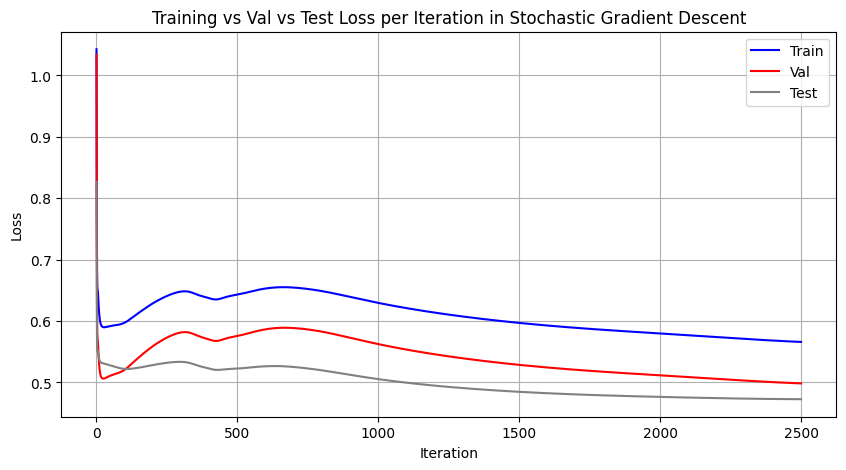

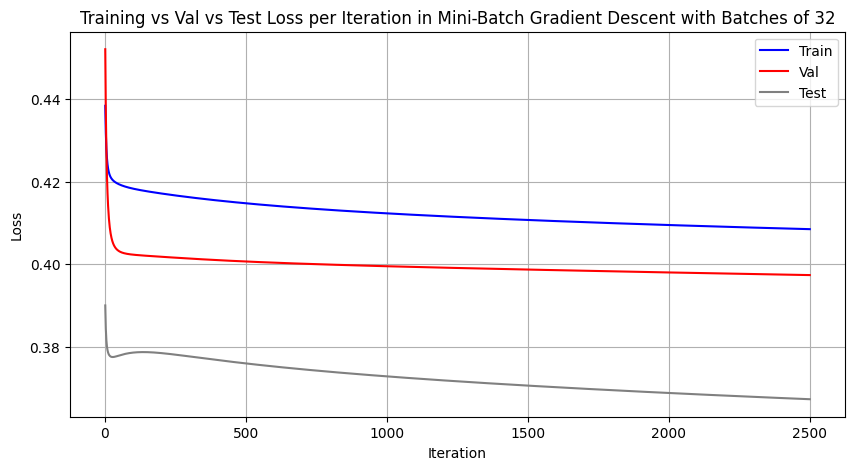

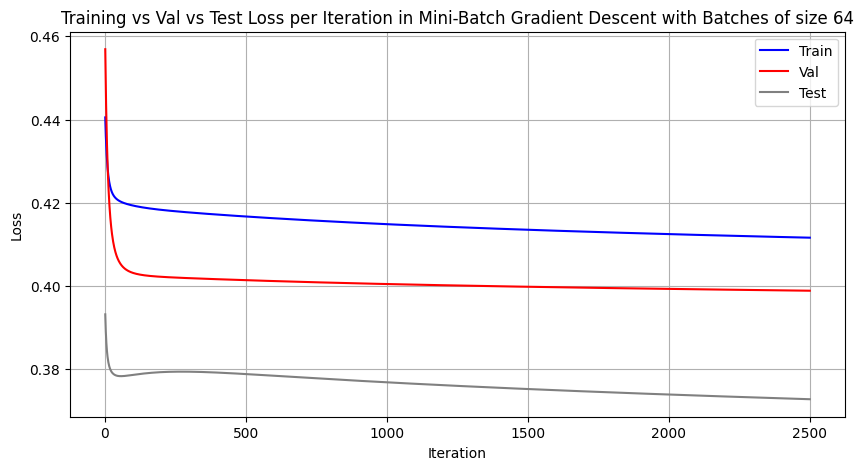

In [68]:
iterations = [i for i in range(1, n_iter + 1)]

plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_train, linestyle='-', color='b', label = 'Train')
plt.plot(iterations, loss_arr_val, linestyle='-', color='r', label = 'Val')
plt.plot(iterations, loss_arr_test, linestyle='-', color='grey', label = 'Test')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training vs Val vs Test Loss per Iteration in Stochastic Gradient Descent')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_train_mb1, linestyle='-', color='b', label = 'Train')
plt.plot(iterations, loss_arr_val_mb1, linestyle='-', color='r', label = 'Val')
plt.plot(iterations, loss_arr_test_mb1, linestyle='-', color='grey', label = 'Test')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training vs Val vs Test Loss per Iteration in Mini-Batch Gradient Descent with Batches of 32')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_train_mb2, linestyle='-', color='b', label = 'Train')
plt.plot(iterations, loss_arr_val_mb2, linestyle='-', color='r', label = 'Val')
plt.plot(iterations, loss_arr_test_mb2, linestyle='-', color='grey', label = 'Test')
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.title('Training vs Val vs Test Loss per Iteration in Mini-Batch Gradient Descent with Batches of size 64')
plt.legend()
plt.grid(True)
plt.show()

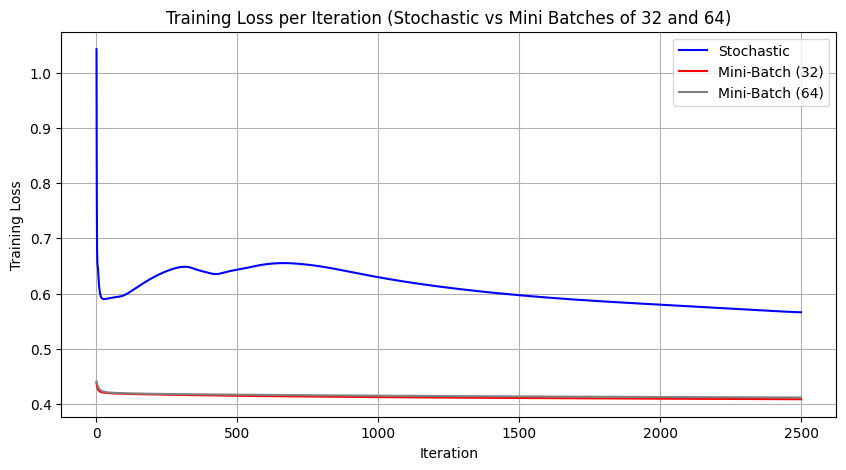

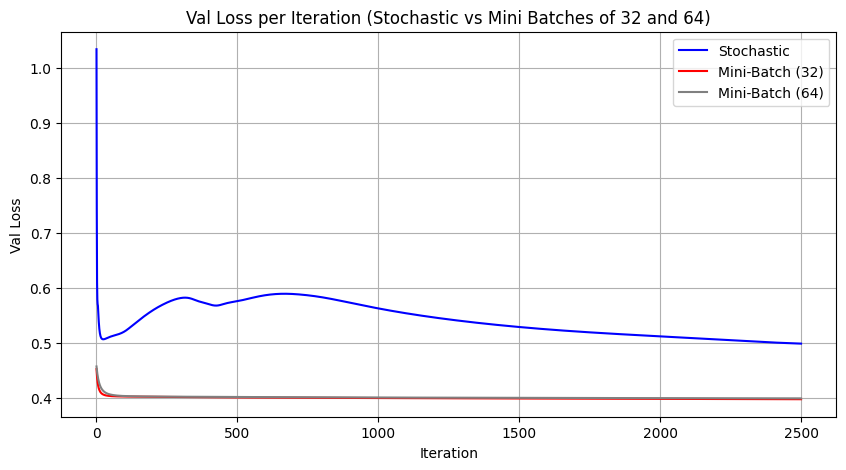

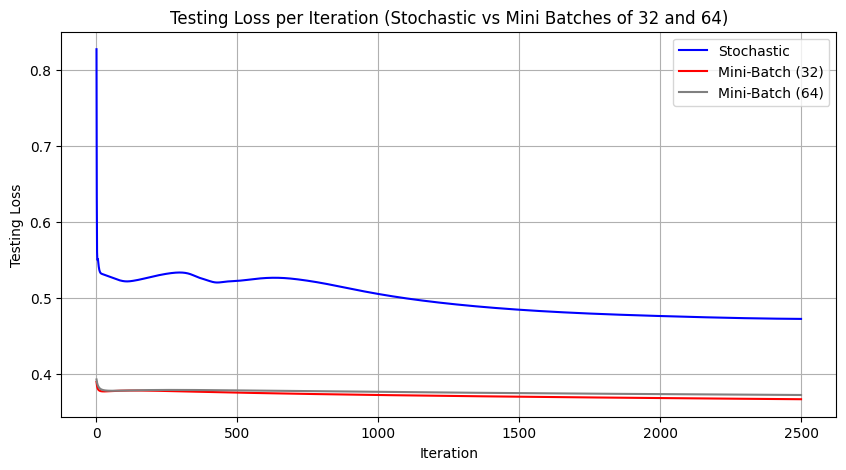

In [69]:
plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_train, linestyle='-', color='b', label = 'Stochastic')
plt.plot(iterations, loss_arr_train_mb1, linestyle='-', color='r', label = 'Mini-Batch (32)')
plt.plot(iterations, loss_arr_train_mb2, linestyle='-', color='grey', label = 'Mini-Batch (64)')
plt.xlabel('Iteration')
plt.ylabel('Training Loss')
plt.title('Training Loss per Iteration (Stochastic vs Mini Batches of 32 and 64)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_val, linestyle='-', color='b', label = 'Stochastic')
plt.plot(iterations, loss_arr_val_mb1, linestyle='-', color='r', label = 'Mini-Batch (32)')
plt.plot(iterations, loss_arr_val_mb2, linestyle='-', color='grey', label = 'Mini-Batch (64)')
plt.xlabel('Iteration')
plt.ylabel('Val Loss')
plt.title('Val Loss per Iteration (Stochastic vs Mini Batches of 32 and 64)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_test, linestyle='-', color='b', label = 'Stochastic')
plt.plot(iterations, loss_arr_test_mb1, linestyle='-', color='r', label = 'Mini-Batch (32)')
plt.plot(iterations, loss_arr_test_mb2, linestyle='-', color='grey', label = 'Mini-Batch (64)')
plt.xlabel('Iteration')
plt.ylabel('Testing Loss')
plt.title('Testing Loss per Iteration (Stochastic vs Mini Batches of 32 and 64)')
plt.legend()
plt.grid(True)
plt.show()

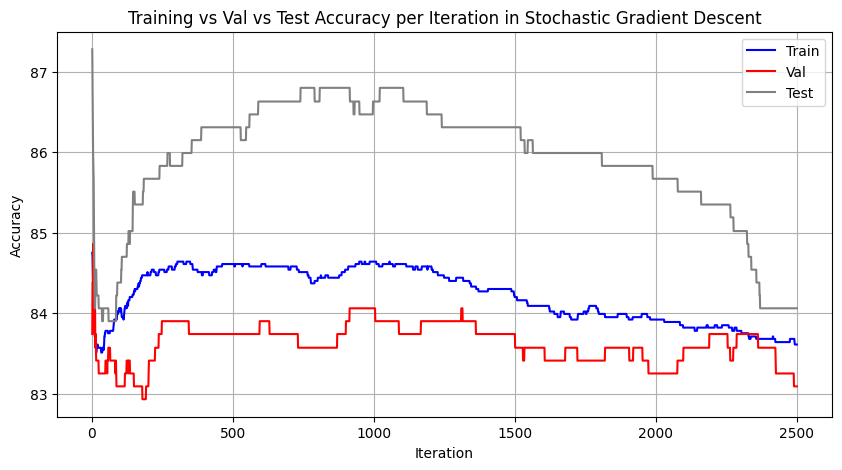

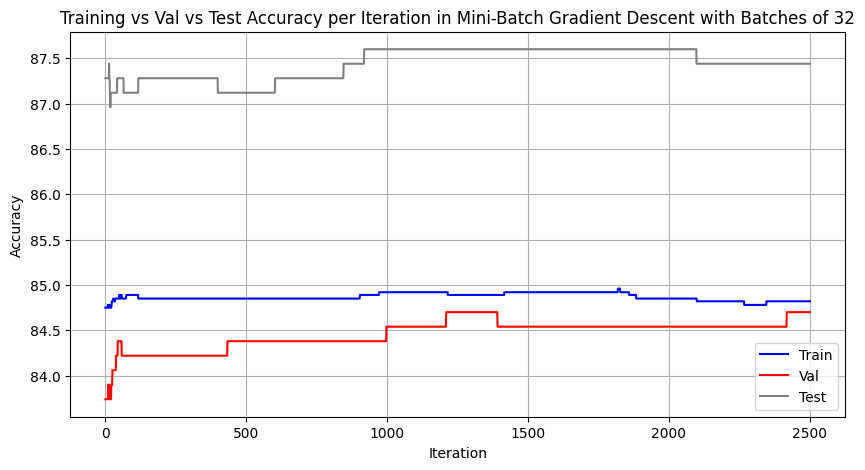

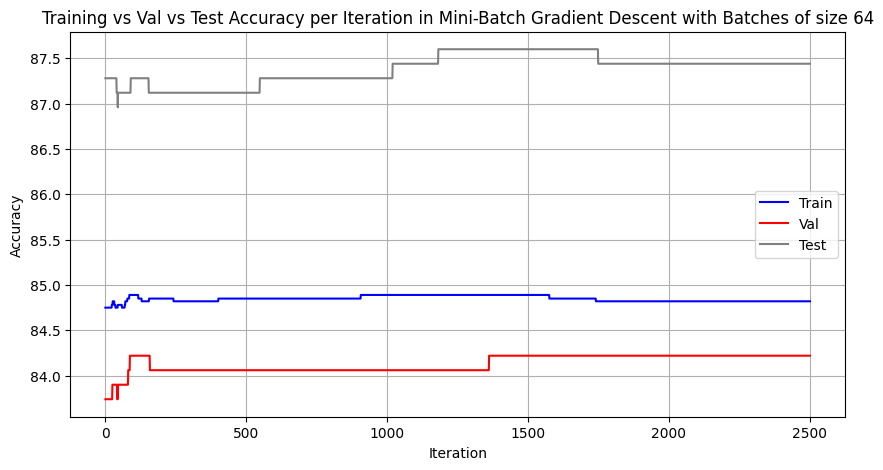

In [70]:
plt.figure(figsize=(10,5))
plt.plot(iterations, accuracy_train, linestyle='-', color='b', label = 'Train')
plt.plot(iterations, accuracy_val, linestyle='-', color='r', label = 'Val')
plt.plot(iterations, accuracy_test, linestyle='-', color='grey', label = 'Test')
plt.xlabel('Iteration')
plt.ylabel('Accuracy')
plt.title('Training vs Val vs Test Accuracy per Iteration in Stochastic Gradient Descent')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, accuracy_train_mb1, linestyle='-', color='b', label = 'Train')
plt.plot(iterations, accuracy_val_mb1, linestyle='-', color='r', label = 'Val')
plt.plot(iterations, accuracy_test_mb1, linestyle='-', color='grey', label = 'Test')
plt.xlabel('Iteration')
plt.ylabel('Accuracy')
plt.title('Training vs Val vs Test Accuracy per Iteration in Mini-Batch Gradient Descent with Batches of 32')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, accuracy_train_mb2, linestyle='-', color='b', label = 'Train')
plt.plot(iterations, accuracy_val_mb2, linestyle='-', color='r', label = 'Val')
plt.plot(iterations, accuracy_test_mb2, linestyle='-', color='grey', label = 'Test')
plt.xlabel('Iteration')
plt.ylabel('Accuracy')
plt.title('Training vs Val vs Test Accuracy per Iteration in Mini-Batch Gradient Descent with Batches of size 64')
plt.legend()
plt.grid(True)
plt.show()

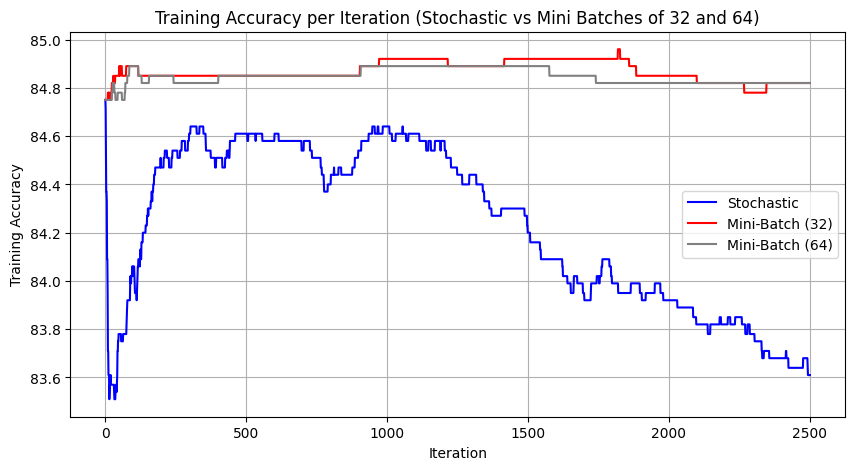

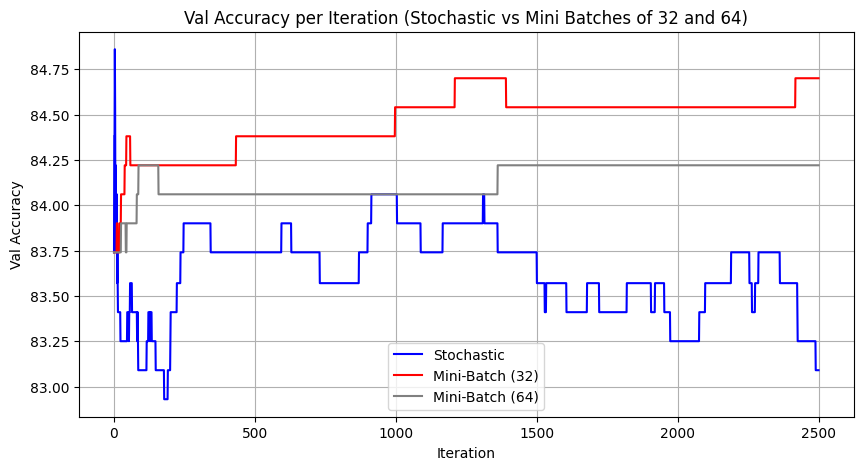

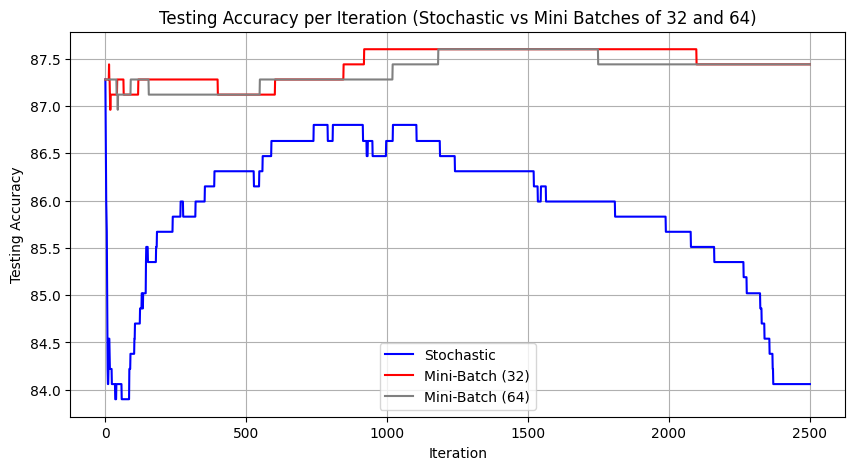

In [71]:
plt.figure(figsize=(10,5))
plt.plot(iterations, accuracy_train, linestyle='-', color='b', label = 'Stochastic')
plt.plot(iterations, accuracy_train_mb1, linestyle='-', color='r', label = 'Mini-Batch (32)')
plt.plot(iterations, accuracy_train_mb2, linestyle='-', color='grey', label = 'Mini-Batch (64)')
plt.xlabel('Iteration')
plt.ylabel('Training Accuracy')
plt.title('Training Accuracy per Iteration (Stochastic vs Mini Batches of 32 and 64)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, accuracy_val, linestyle='-', color='b', label = 'Stochastic')
plt.plot(iterations, accuracy_val_mb1, linestyle='-', color='r', label = 'Mini-Batch (32)')
plt.plot(iterations, accuracy_val_mb2, linestyle='-', color='grey', label = 'Mini-Batch (64)')
plt.xlabel('Iteration')
plt.ylabel('Val Accuracy')
plt.title('Val Accuracy per Iteration (Stochastic vs Mini Batches of 32 and 64)')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, accuracy_test, linestyle='-', color='b', label = 'Stochastic')
plt.plot(iterations, accuracy_test_mb1, linestyle='-', color='r', label = 'Mini-Batch (32)')
plt.plot(iterations, accuracy_test_mb2, linestyle='-', color='grey', label = 'Mini-Batch (64)')
plt.xlabel('Iteration')
plt.ylabel('Testing Accuracy')
plt.title('Testing Accuracy per Iteration (Stochastic vs Mini Batches of 32 and 64)')
plt.legend()
plt.grid(True)
plt.show()

In terms of loss, Mini-Batch Gradient Descent with batchsize of 32 had much lower loss than that of batchsize of 64 and stochastic gradient descent. Both minibatches had similar loss, but stochastic gradient descent had much worse. Based on the graph, it looked like stochastic gradient descent entered a region of local minima which was much worse than other regions and thus the initial increase in loss, and then subsequent decrease. In terms of accuracy, mini-batch with batchsize of 32 was better for val accuracy while for test, they were very similar. But, stochastic gradient descent failed to have good accuracy.

Convergence Speed :- Stochastic gradient descent took a long time to converge at a learning rate of 0.0001. Whereas, the 2 mini-batch gradient descents were much faster at converging. Perhaps, with a much larger number of epochs, it would converge and be better than the mini-batches.

Stability :- Stochastic was also more unstable. The variation in accuracy and loss at times indicates a lack of stability even at such a low learning rate. Whereas the loss and accuracy of the mini-batch gradient descents were more consistent.

Part (e) K-Fold Cross Validation

In [72]:
# Assuming that the question wanted us to test cross-validation on the model with batch gradient descent and nothing else.



# We first create 5 splits of data. I am assuming, we don't need a val set, and will only deal with train and test splits.
n_entries = len(data)
n_samp_test_cv = int(0.2 * n_entries) # No. of samples in test set
startpoint = 0
n_features = train.shape[1] - 1

acc_l = []
prec_l = []
rec_l = []
f1_l = []

for i in range(5):
    test_cv = data[startpoint : startpoint + n_samp_test_cv]
    if i == 0:
        train_cv = data[startpoint + n_samp_test_cv:]
    else:
        train1 = data[:startpoint]
        train2 = data[startpoint + n_samp_test_cv : n_entries]
        train_cv = pd.concat([train1, train2])

    startpoint = startpoint + n_samp_test_cv

    loss_train_cv, loss_test_cv, accuracy_train_cv, accuracy_test_cv, n_iter_cv, b_arr_cv = grad_descent(train_cv, test_cv)

    x_test_cv = test_cv.iloc[:, :n_features]
    y_test_cv = test_cv.iloc[:, n_features:]
    x_test_mat_cv = x_test_cv.to_numpy()
    y_test_mat_cv = y_test_cv.to_numpy()

    test_entries_cv = x_test_mat_cv.shape[0]

    ones_column = np.ones((test_entries_cv, 1))
    x_test_mat_cv = np.hstack((x_test_mat_cv, ones_column))

    test_xb_matrix_cv = np.matmul(x_test_mat_cv, b_arr_cv) # xb
    test_pxi_matrix_cv = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in test_xb_matrix_cv]).T # Sigmoid = p(xi)

    tp = 0
    tn = 0
    fp = 0
    fn = 0

    y_pred = []

    for i in range(test_entries_cv):
        if y_test_mat_cv.item((i,0)) == 1:
            if test_pxi_matrix_cv.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                y_pred.append(1)
                tp += 1
            else:
                y_pred.append(0)
                fn += 1
        else:
            if test_pxi_matrix_cv.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                y_pred.append(0)
                tn += 1
            else:
                y_pred.append(1)
                fp += 1

    # print(f'''Confusion Matrix:
    #                                     Predicted Class
    #                                 Heart Disease   No Heart Disease
    # Actual Class    Heart Disease            {tp}              {fn}
    #                 No Heart Disease         {fp}              {tn}



    # ''')

    recall = tp / (tp + fn)
    try:
        precision = tp / (tp + fp)
    except:
        precision = 0
    accuracy = (tp + tn) / (tp + tn + fp + fn)
    f1 = (2 * precision * recall) / (precision + recall)

    rec_l.append(recall)
    prec_l.append(precision)
    acc_l.append(round(accuracy*100, 2))
    f1_l.append(f1)

for i in range(5):
    print(f"\n\nIn Iteration {i+1} ->\n\n")
    print(f"Recall -> {rec_l[i]}")
    print(f"Precision -> {prec_l[i]}")
    print(f"Accuracy -> {acc_l[i]}%")
    print(f"F1 score -> {f1_l[i]}")

rec_l = np.array(rec_l)
prec_l = np.array(prec_l)
acc_l = np.array(acc_l)
f1_l = np.array(f1_l)

print(f"\n\n\nAvg recall -> {np.mean(rec_l)}. Std Dev of Recall -> {np.std(rec_l)}. Variance of Recall -> {np.std(rec_l) * np.std(rec_l)}")
print(f"Avg precision -> {np.mean(prec_l)}. Std Dev of Precision -> {np.std(prec_l)}. Variance of Precision -> {np.std(prec_l) * np.std(prec_l)}")
print(f"Avg accuracy -> {np.mean(acc_l)}%. Std Dev of Accuracy -> {np.std(acc_l)}. Variance of Accuracy -> {np.std(acc_l) * np.std(acc_l)}")
print(f"Avg F1 score -> {np.mean(f1_l)}. Std Dev of F1 Score -> {np.std(f1_l)}. Variance of F1 Score -> {np.std(f1_l) * np.std(f1_l)}")


Training Loss at iteration 1 -> 0.555463520465862
Training Accuracy at iteration 1 -> 85.02%

Val Loss at iteration 1 -> 0.5741086872572227
Val Accuracy at iteration 1 -> 84.78%


Training Loss at iteration 2 -> 0.450127936722603
Training Accuracy at iteration 2 -> 85.02%

Val Loss at iteration 2 -> 0.46161406903133534
Val Accuracy at iteration 2 -> 84.78%


Training Loss at iteration 3 -> 0.4371602239430663
Training Accuracy at iteration 3 -> 85.02%

Val Loss at iteration 3 -> 0.4455642678344775
Val Accuracy at iteration 3 -> 84.78%


Training Loss at iteration 4 -> 0.4370037158754346
Training Accuracy at iteration 4 -> 85.02%

Val Loss at iteration 4 -> 0.44567707298576253
Val Accuracy at iteration 4 -> 84.78%


Training Loss at iteration 5 -> 0.43689701676903225
Training Accuracy at iteration 5 -> 85.02%

Val Loss at iteration 5 -> 0.4455468515526024
Val Accuracy at iteration 5 -> 84.78%


Training Loss at iteration 6 -> 0.4367945266952814
Training Accuracy at iteration 6 -> 85.02%

The Average Recall, F1 score are really bad. The precision is average and the accuracy is rather decent, but that is mainly because of a imbalance in classes in the dataset. There is a much larger number of cases which are not ‘heart disease’ so, you can see why the average is high, but it leads to the model not really grasping the balance between ‘non-heart disease’ and ‘heart disease’.

Across the folds, the accuracy and precision vary a bit, but not by much, and so, overall, the model is rather stable, and there’s not much variance in the performance of the model.

Part (f) -> Early Stopping and Regularization

In [73]:
# We need to find out the best model so far. To do so, I will check the recall and other scores for Mini-Batch Gradient Descent
# with batchsize of 32, which had better val loss than regular gradient descent, but worse than the feature scaled model.
# But, if the F1 Score and other scores are better by a margin for the Mini-Batch model, I would prefer it to feature scaling.

from sklearn.metrics import roc_curve, roc_auc_score # Using sklearn only for ROC-AUC curve

# Using the best coefficients achieved before, during gradient descent, the confusion matrix is generated on the val set.
# We use the feature scaled model, as it has displayed better val loss at the end of 10000 epochs.
n_features = train.shape[1] - 1

x_val = val.iloc[:, :n_features]
y_val = val.iloc[:, n_features:]
x_val_mat = x_val.to_numpy()
y_val_mat = y_val.to_numpy()

val_entries = x_val_mat.shape[0]

ones_column = np.ones((val_entries, 1))
x_val_mat = np.hstack((x_val_mat, ones_column))

val_xb_matrix = np.matmul(x_val_mat, b_arr_mb_32) # xb that too with the coefficients with the feature scaled model
val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

tp = 0
tn = 0
fp = 0
fn = 0

y_pred = []

for i in range(val_entries):
    if y_val_mat.item((i,0)) == 1:
        if val_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
            y_pred.append(1)
            tp += 1
        else:
            y_pred.append(0)
            fn += 1
    else:
        if val_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
            y_pred.append(0)
            tn += 1
        else:
            y_pred.append(1)
            fp += 1

y_pred = np.array(y_pred)

print(f'''Confusion Matrix:
                                        Predicted Class
                                    Heart Disease   No Heart Disease
Actual Class    Heart Disease            {tp}              {fn}
                No Heart Disease         {fp}              {tn}



''')

recall = tp / (tp + fn)
precision = tp / (tp + fp)

print(f"Recall -> {recall}")
print(f"Precision -> {precision}")
print(f"F1 Score -> {(2 * precision * recall) / (precision + recall)}")
print(f"ROC-AUC Score -> {roc_auc_score(y_val_mat, y_pred)}")

Confusion Matrix:
                                        Predicted Class
                                    Heart Disease   No Heart Disease
Actual Class    Heart Disease            9              92
                No Heart Disease         3              517




Recall -> 0.0891089108910891
Precision -> 0.75
F1 Score -> 0.15929203539823011
ROC-AUC Score -> 0.5416698400609292


In [74]:
# Best Method Observed so far is Mini Batch with size 32. I am not doing feature scaling with it, because not mentioned in question
# to combine the various optimizations. The reason I use Mini Batch is because while it has worse loss, the F1 score is better and
# it does slighly better at predicting both heart disease and not heart disease, and not just 'not heart disease'.

def grad_descent_best(train, val, test, batchsize = 32, learning_rate = 0.0001, epochs = 2500, early_stopping = True):
    # There are 16 weights in total as there are 15 features, so xb is a multiplication
    # of a 1*16 with a 16*1 matrix where b = transpose of [b1, b2, b3, ..., b16] and x = [x1, x2, x3, ..., x15, 1] and so,
    # o = x1b1 + x2b2 + ... + x15b15 + b16

    n_features = train.shape[1] - 1
    b_arr = [0 for i in range(n_features + 1)] # Initializing the weights with a small value as with larger number, xb could
                                               # become too large, leading to log(p) tending to infinity.


    # Splitting train and val dataset into x and y
    x_train = train.iloc[:, :n_features]
    y_train = train.iloc[:, n_features:]
    x_matrix = x_train.to_numpy()
    y_matrix = y_train.to_numpy()

    x_val = val.iloc[:, :n_features]
    y_val = val.iloc[:, n_features:]
    x_val_mat = x_val.to_numpy()
    y_val_mat = y_val.to_numpy()

    x_test = test.iloc[:, :n_features]
    y_test = test.iloc[:, n_features:]
    x_test_mat = x_test.to_numpy()
    y_test_mat = y_test.to_numpy()

    n_entries = x_matrix.shape[0]
    val_entries = x_val_mat.shape[0]
    test_entries = x_test_mat.shape[0]

    # Adding a column of 1s to the end of the feature matrix, as that column will be multiplying with the constant in the eq. above.
    ones_column = np.ones((n_entries, 1))
    x_matrix = np.hstack((x_matrix, ones_column))

    ones_column = np.ones((val_entries, 1))
    x_val_mat = np.hstack((x_val_mat, ones_column))

    ones_column = np.ones((test_entries, 1))
    x_test_mat = np.hstack((x_test_mat, ones_column))

    # Finding initial val loss, for future comparison, for stopping the gradient descent.
    tot_loss = 0
    n_acc = 0
    val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
    val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

    for i in range(val_entries):
        if y_val_mat.item((i,0)) == 1:
            tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
        else:
            tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)

    curr_min = tot_loss / val_entries
    prev_min = curr_min + 1

    n_iter = 0

    loss_arr_train = []
    loss_arr_val = []
    loss_arr_test = []
    accuracy_train = []
    accuracy_val = []
    accuracy_test = []

    n_min_batches = n_entries // batchsize
    flag = True
    if n_entries % batchsize != 0: # To find if there's a batch that will have less than the prescribed batchsize
        flag = False

    for i in range(epochs):
        if n_iter % 100 == 0 and early_stopping: # Early stopping based on sufficient decrease in val loss.
            if curr_min >= prev_min - 0.005:
                print("Gradient not descending sufficiently anymore. Stopping.")
                break
            prev_min = curr_min

        for i in range(n_min_batches):
            # For performing gradient descent, we need to compute the gradient of the loss function with respect to the parameters.
            # That gradient = -(y - h(xb))x where h is the sigmoid function. The following line calculate this gradient, utilizing
            # (y-h(xb)).

            xb_matrix = np.matmul(x_matrix[batchsize*i : batchsize*(i+1),:],b_arr)
            pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T
            curr_step = y_matrix[batchsize*i : batchsize*(i+1)] - pxi_matrix

            grad_mat = x_matrix[batchsize*i : batchsize*(i+1),:].copy()
            for i in range(batchsize):
                grad_mat[i,:] *= curr_step.item((i,0)) # (y - h(xb)) * x

            avg_gradient = np.mean(grad_mat, axis = 0) # Calculating avg gradients across the mini-batch for all the weights.
            avg_gradient *= learning_rate # Multiplying by learning rate
            if np.all(avg_gradient == 0):
                return loss_arr_train, loss_arr_val, accuracy_train, accuracy_val, n_iter, b_arr # If gradient is 0, stop
            b_arr = b_arr + avg_gradient # Updating Weight

        # If there's excess, the following code deals with it.
        if not flag:
            xb_matrix = np.matmul(x_matrix[batchsize * n_min_batches : n_entries,:],b_arr)
            pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T
            curr_step = y_matrix[batchsize * n_min_batches : n_entries] - pxi_matrix

            grad_mat = x_matrix[batchsize * n_min_batches : n_entries,:].copy()
            for i in range(n_entries % batchsize):
                grad_mat[i,:] *= curr_step.item((i,0)) # (y - h(xb)) * x

            avg_gradient = np.mean(grad_mat, axis = 0) # Calculating avg gradients across the mini-batch for all the weights.
            avg_gradient *= learning_rate # Multiplying by learning rate
            if np.all(avg_gradient == 0):
                return loss_arr_train, loss_arr_val, accuracy_train, accuracy_val, n_iter, b_arr # If gradient is 0, stop
            b_arr = b_arr + avg_gradient # Updating Weight

        # Finding cross entropy loss and accuracy for train set
        tot_loss = 0
        n_acc = 0
        xb_matrix = np.matmul(x_matrix, b_arr) # xb
        pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T

        for i in range(n_entries):
            if y_matrix.item((i,0)) == 1:
                tot_loss += (-1) * np.log(pxi_matrix.item((i,0))) # loss is -log(p)
                if pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - pxi_matrix.item((i,0))) # loss is -log(1-p)
                if pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        print(f"\nTrain Loss at iteration {n_iter+1} -> {tot_loss / n_entries}")
        loss_arr_train.append(tot_loss / n_entries)
        accuracy_train.append(round((n_acc / n_entries) * 100, 2))
        print(f"Train Accuracy at iteration {n_iter+1} -> {round((n_acc / n_entries) * 100, 2)}%\n")

        # Finding cross entropy loss and accuracy for val set

        tot_loss = 0
        n_acc = 0
        val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
        val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

        for i in range(val_entries):
            if y_val_mat.item((i,0)) == 1:
                tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
                if val_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)
                if val_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        loss_arr_val.append(tot_loss / val_entries)
        accuracy_val.append(round((n_acc / val_entries) * 100, 2))
        print(f"\nVal Loss at iteration {n_iter+1} -> {tot_loss / val_entries}")
        print(f"Val Accuracy at iteration {n_iter+1} -> {round((n_acc / val_entries) * 100, 2)}%\n")

        if tot_loss / val_entries <= curr_min:
            curr_min = tot_loss / val_entries

        # Finding cross entropy loss and accuracy for test set

        tot_loss = 0
        n_acc = 0
        test_xb_matrix = np.matmul(x_test_mat, b_arr) # xb
        test_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in test_xb_matrix]).T # Sigmoid = p(xi)

        for i in range(test_entries):
            if y_test_mat.item((i,0)) == 1:
                tot_loss += (-1) * np.log(test_pxi_matrix.item((i,0))) # loss is -log(p)
                if test_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - test_pxi_matrix.item((i,0))) # loss is -log(1-p)
                if test_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        loss_arr_test.append(tot_loss / test_entries)
        accuracy_test.append(round((n_acc / test_entries) * 100, 2))
        print(f"\nTest Loss at iteration {n_iter+1} -> {tot_loss / test_entries}")
        print(f"Test Accuracy at iteration {n_iter+1} -> {round((n_acc / test_entries) * 100, 2)}%\n")

        n_iter+=1

    return loss_arr_train, loss_arr_val, loss_arr_test, accuracy_train, accuracy_val,accuracy_test, n_iter, b_arr

loss_arr_train, loss_arr_val, loss_arr_test, accuracy_train, accuracy_val,accuracy_test, n_iter, b_arr = grad_descent_best(train, val, test, early_stopping=False)
loss_arr_train_es, loss_arr_val_es, loss_arr_test_es, accuracy_train_es, accuracy_val_es,accuracy_test_es, n_iter_es, b_arr_es = grad_descent_best(train, val, test) # With Early Stopping


Train Loss at iteration 1 -> 0.4383775061678284
Train Accuracy at iteration 1 -> 84.75%


Val Loss at iteration 1 -> 0.4520879326917633
Val Accuracy at iteration 1 -> 83.74%


Test Loss at iteration 1 -> 0.3899738386075808
Test Accuracy at iteration 1 -> 87.28%


Train Loss at iteration 2 -> 0.434694483538435
Train Accuracy at iteration 2 -> 84.75%


Val Loss at iteration 2 -> 0.44379608640158574
Val Accuracy at iteration 2 -> 83.74%


Test Loss at iteration 2 -> 0.3865907002198123
Test Accuracy at iteration 2 -> 87.28%


Train Loss at iteration 3 -> 0.4318794150332914
Train Accuracy at iteration 3 -> 84.75%


Val Loss at iteration 3 -> 0.4372443604876782
Val Accuracy at iteration 3 -> 83.74%


Test Loss at iteration 3 -> 0.3843080161131736
Test Accuracy at iteration 3 -> 87.28%


Train Loss at iteration 4 -> 0.42971499020553383
Train Accuracy at iteration 4 -> 84.75%


Val Loss at iteration 4 -> 0.4320114893774416
Val Accuracy at iteration 4 -> 83.74%


Test Loss at iteration 4 -> 0.

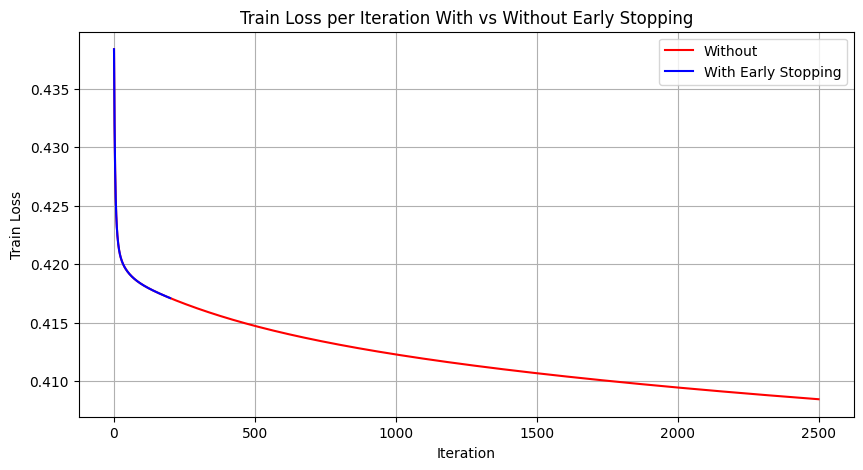

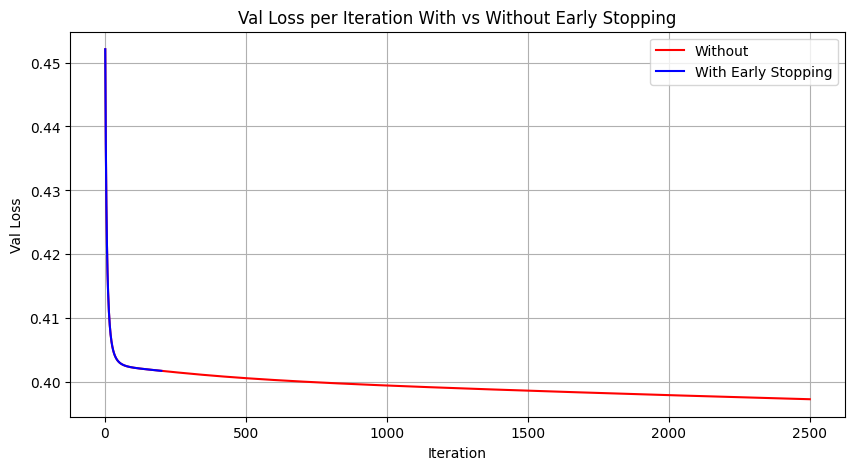

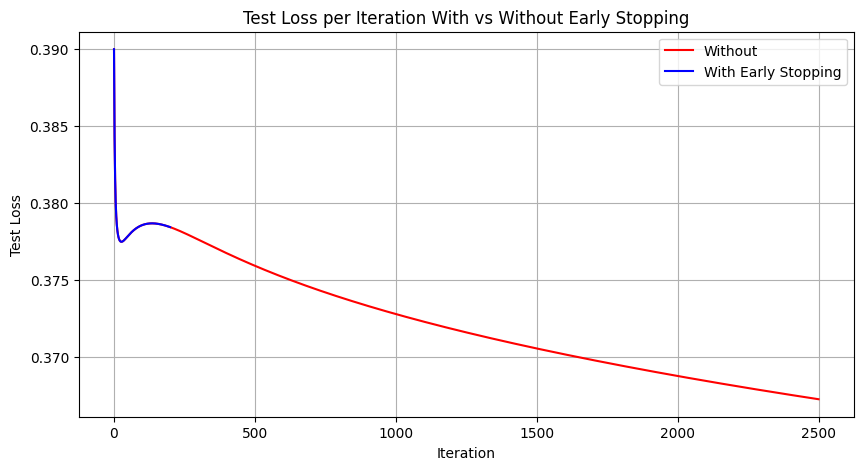

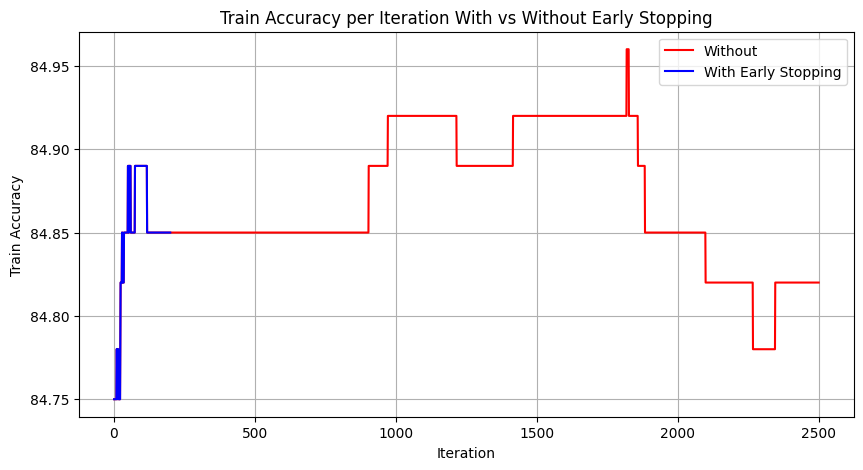

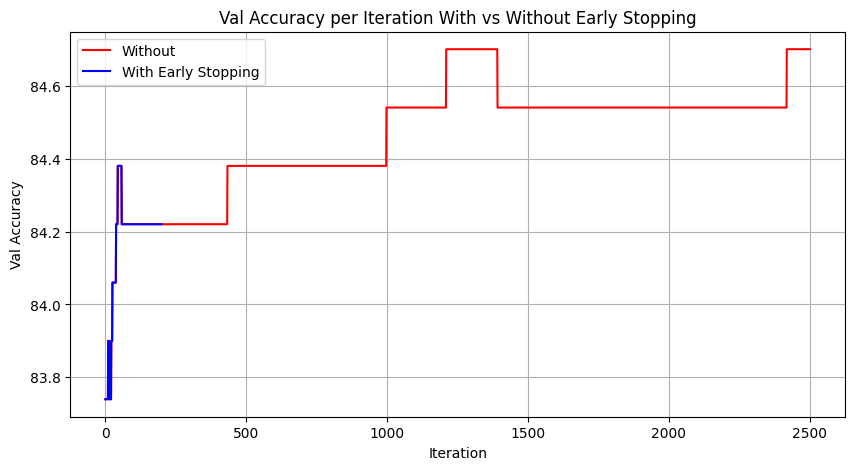

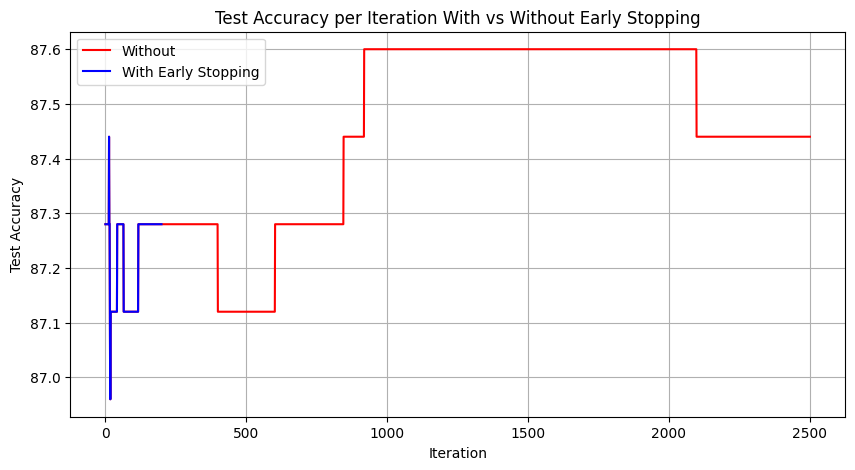

In [75]:
iterations1 = [i for i in range(1, n_iter + 1)]
iterations2 = [i for i in range(1, n_iter_es + 1)]

plt.figure(figsize=(10,5))
plt.plot(iterations1, loss_arr_train, linestyle='-', color='r', label = 'Without')
plt.plot(iterations2, loss_arr_train_es, linestyle='-', color='b', label = 'With Early Stopping')
plt.xlabel('Iteration')
plt.ylabel('Train Loss')
plt.title('Train Loss per Iteration With vs Without Early Stopping')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations1, loss_arr_val, linestyle='-', color='r', label = 'Without')
plt.plot(iterations2, loss_arr_val_es, linestyle='-', color='b', label = 'With Early Stopping')
plt.xlabel('Iteration')
plt.ylabel('Val Loss')
plt.title('Val Loss per Iteration With vs Without Early Stopping')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, loss_arr_test, linestyle='-', color='r', label = 'Without')
plt.plot(iterations2, loss_arr_test_es, linestyle='-', color='b', label = 'With Early Stopping')
plt.xlabel('Iteration')
plt.ylabel('Test Loss')
plt.title('Test Loss per Iteration With vs Without Early Stopping')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, accuracy_train, linestyle='-', color='r', label = 'Without')
plt.plot(iterations2, accuracy_train_es, linestyle='-', color='b', label = 'With Early Stopping')
plt.xlabel('Iteration')
plt.ylabel('Train Accuracy')
plt.title('Train Accuracy per Iteration With vs Without Early Stopping')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, accuracy_val, linestyle='-', color='r', label = 'Without')
plt.plot(iterations2, accuracy_val_es, linestyle='-', color='b', label = 'With Early Stopping')
plt.xlabel('Iteration')
plt.ylabel('Val Accuracy')
plt.title('Val Accuracy per Iteration With vs Without Early Stopping')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(iterations, accuracy_test, linestyle='-', color='r', label = 'Without')
plt.plot(iterations2, accuracy_test_es, linestyle='-', color='b', label = 'With Early Stopping')
plt.xlabel('Iteration')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy per Iteration With vs Without Early Stopping')
plt.legend()
plt.grid(True)
plt.show()

Based on the test loss, it feels like the early stopping was done too early. The accuracy was better but more importantly, the test loss was decreasing quite a lot even after stopping. There is not much overfitting at all, as we don’t see an increase in val or test loss. So, it isn’t memorizing the train data and not generalizing at all.

Confusion Matrix without Early Stopping:
                                        Predicted Class
                                    Heart Disease   No Heart Disease
Actual Class    Heart Disease            46              33
                No Heart Disease         160              382




Confusion Matrix with Early Stopping:
                                        Predicted Class
                                    Heart Disease   No Heart Disease
Actual Class    Heart Disease            24              55
                No Heart Disease         66              476






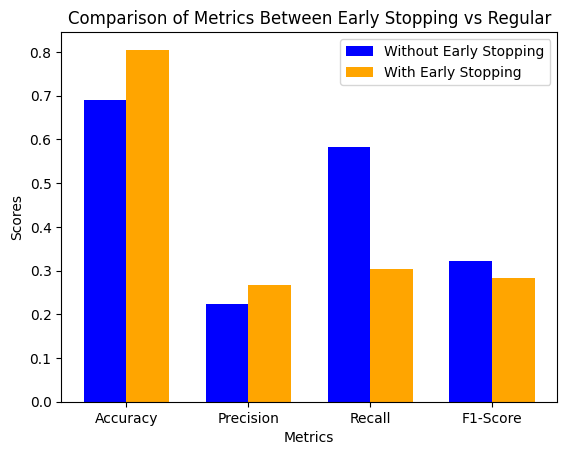

Accuracy Without -> 0.6892109500805152. With -> 0.8051529790660226
Precision Without -> 0.22330097087378642. With -> 0.26666666666666666
Recall Without -> 0.5822784810126582. With -> 0.3037974683544304
F1 Score Without -> 0.3228070175438597. With -> 0.28402366863905326


In [79]:
n_features = train.shape[1] - 1

x_test = test_scaled.iloc[:, :n_features]
y_test = test_scaled.iloc[:, n_features:]
x_test_mat = x_test.to_numpy()
y_test_mat = y_test.to_numpy()

test_entries = x_test_mat.shape[0]

ones_column = np.ones((test_entries, 1))
x_test_mat = np.hstack((x_test_mat, ones_column))

test_xb_matrix = np.matmul(x_test_mat, b_arr) # xb
test_xb_matrix_es = np.matmul(x_test_mat, b_arr_es) # For early stopping

test_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in test_xb_matrix]).T # Sigmoid = p(xi)
test_pxi_matrix_es = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in test_xb_matrix_es]).T

tp = 0
tn = 0
fp = 0
fn = 0

for i in range(test_entries):
    if y_test_mat.item((i,0)) == 1:
        if test_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
            tp += 1
        else:
            fn += 1
    else:
        if test_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
            tn += 1
        else:
            fp += 1

accuracy = (tp + tn) / (tp + tn + fp + fn)
recall = tp / (tp + fn)
try:
    precision = tp / (tp + fp)
except:
    precision = 0
f1 = (2 * precision * recall) / (precision + recall)

print(f'''Confusion Matrix without Early Stopping:
                                        Predicted Class
                                    Heart Disease   No Heart Disease
Actual Class    Heart Disease            {tp}              {fn}
                No Heart Disease         {fp}              {tn}



''')

# With Early Stopping
tp = 0
tn = 0
fp = 0
fn = 0

for i in range(test_entries):
    if y_test_mat.item((i,0)) == 1:
        if test_pxi_matrix_es.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
            tp += 1
        else:
            fn += 1
    else:
        if test_pxi_matrix_es.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
            tn += 1
        else:
            fp += 1

accuracy_es = (tp + tn) / (tp + tn + fp + fn)
recall_es = tp / (tp + fn)
try:
    precision_es = tp / (tp + fp)
except:
    precision_es = 0
f1_es = (2 * precision_es * recall_es) / (precision_es + recall_es)

print(f'''Confusion Matrix with Early Stopping:
                                        Predicted Class
                                    Heart Disease   No Heart Disease
Actual Class    Heart Disease            {tp}              {fn}
                No Heart Disease         {fp}              {tn}



''')


metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
without_es = [accuracy, precision, recall, f1]  # Metrics for Without Early Stopping
with_es = [accuracy_es, precision_es, recall_es, f1_es]  # Metrics for With Early Stopping

bar_width = 0.35
index = np.arange(len(metrics))

fig, ax = plt.subplots()

bar1 = ax.bar(index, without_es, bar_width, label='Without Early Stopping', color='blue')
bar2 = ax.bar(index + bar_width, with_es, bar_width, label='With Early Stopping', color='orange')

ax.set_xlabel('Metrics')
ax.set_ylabel('Scores')
ax.set_title('Comparison of Metrics Between Early Stopping vs Regular')
ax.set_xticks(index + bar_width / 2)
ax.set_xticklabels(metrics)
ax.legend()
plt.show()


print(f"Accuracy Without -> {accuracy}. With -> {accuracy_es}")
print(f"Precision Without -> {precision}. With -> {precision_es}")
print(f"Recall Without -> {recall}. With -> {recall_es}")
print(f"F1 Score Without -> {f1}. With -> {f1_es}")

The above are scores on the test set, with early stopping. Clearly this shows the difference between early stopping and without. With more iterations, it trains itself to predict that it’s not a heart disease regardless of the person’s condition, which leads to greater accuracy because of the label imbalance. But it leads to a worse recall, worse f1 score and just a bit better precision. So, it generalizes better though the label imbalance still is the main thing that needs to be resolved.

Train Loss at iteration 1 -> 0.43837786291106806
Train Accuracy at iteration 1 -> 84.75%


Val Loss at iteration 1 -> 0.45208872686642493
Val Accuracy at iteration 1 -> 83.74%


Test Loss at iteration 1 -> 0.389974345936577
Test Accuracy at iteration 1 -> 87.28%

Train Loss at iteration 2 -> 0.4346956897472582
Train Accuracy at iteration 2 -> 84.75%


Val Loss at iteration 2 -> 0.4437989421523987
Val Accuracy at iteration 2 -> 83.74%


Test Loss at iteration 2 -> 0.3865919506966167
Test Accuracy at iteration 2 -> 87.28%

Train Loss at iteration 3 -> 0.4318816145724112
Train Accuracy at iteration 3 -> 84.75%


Val Loss at iteration 3 -> 0.43724982897684195
Val Accuracy at iteration 3 -> 83.74%


Test Loss at iteration 3 -> 0.3843099776440793
Test Accuracy at iteration 3 -> 87.28%

Train Loss at iteration 4 -> 0.42971815171779876
Train Accuracy at iteration 4 -> 84.75%


Val Loss at iteration 4 -> 0.4320197566083274
Val Accuracy at iteration 4 -> 83.74%


Test Loss at iteration 4 -> 0.38

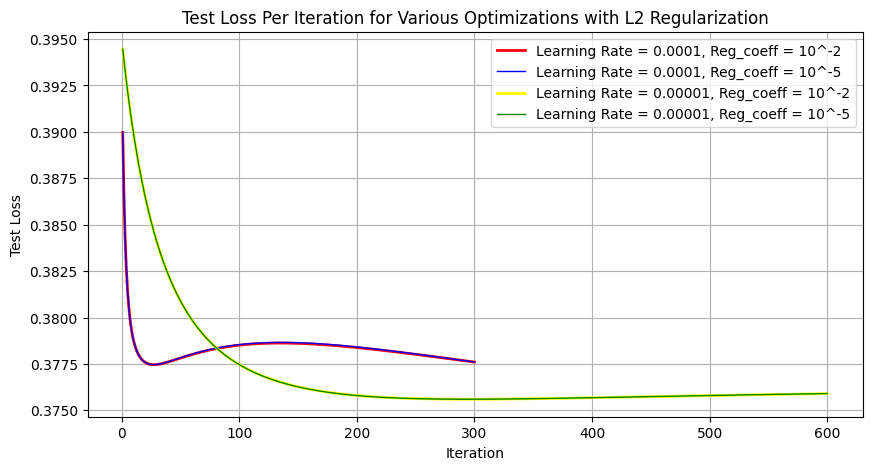

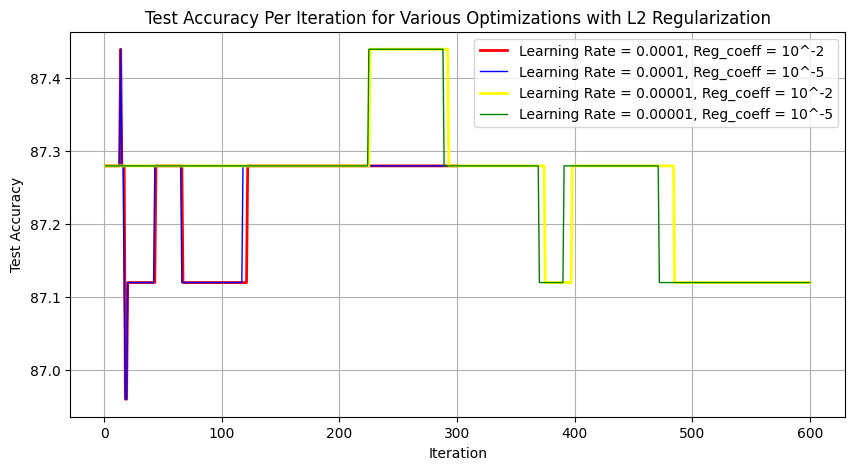

Train Loss at iteration 1 -> 0.43837827994369577
Train Accuracy at iteration 1 -> 84.75%


Val Loss at iteration 1 -> 0.45208911160333753
Val Accuracy at iteration 1 -> 83.74%


Test Loss at iteration 1 -> 0.3899748072875415
Test Accuracy at iteration 1 -> 87.28%

Train Loss at iteration 2 -> 0.4346961913510518
Train Accuracy at iteration 2 -> 84.75%


Val Loss at iteration 2 -> 0.4437993594429243
Val Accuracy at iteration 2 -> 83.74%


Test Loss at iteration 2 -> 0.3865928591708657
Test Accuracy at iteration 2 -> 87.28%

Train Loss at iteration 3 -> 0.43188180220698746
Train Accuracy at iteration 3 -> 84.75%


Val Loss at iteration 3 -> 0.43724923146787387
Val Accuracy at iteration 3 -> 83.74%


Test Loss at iteration 3 -> 0.38431089319783807
Test Accuracy at iteration 3 -> 87.28%

Train Loss at iteration 4 -> 0.4297178754211475
Train Accuracy at iteration 4 -> 84.75%


Val Loss at iteration 4 -> 0.432017603392103
Val Accuracy at iteration 4 -> 83.74%


Test Loss at iteration 4 -> 0.3

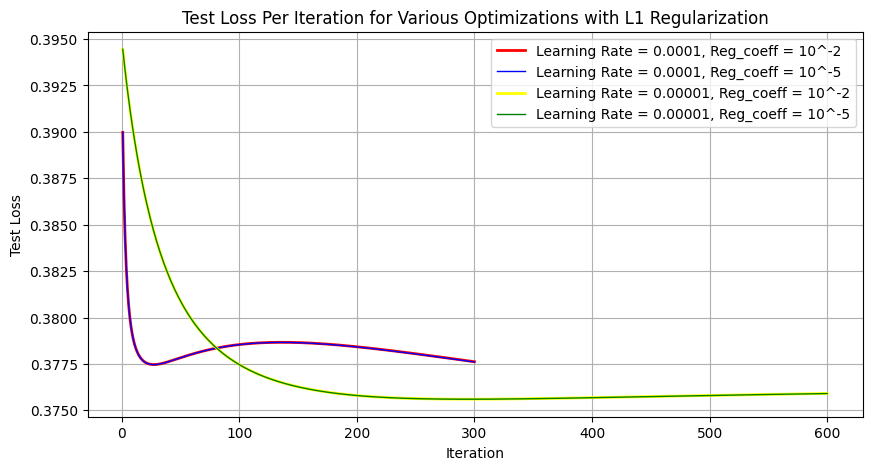

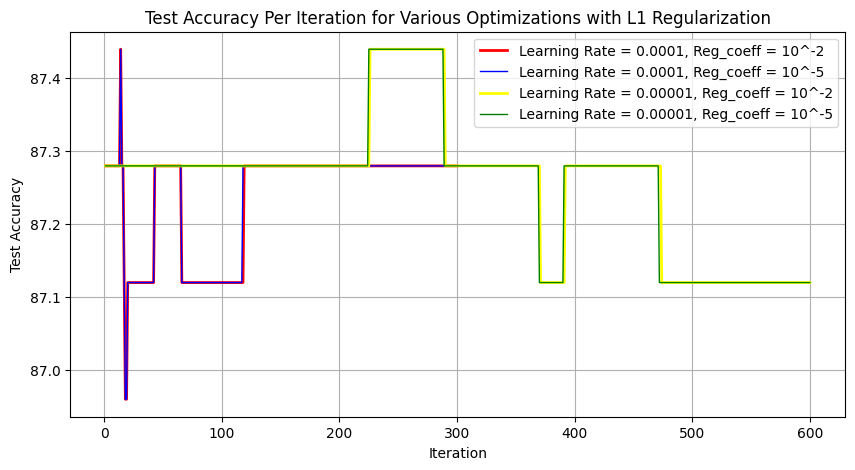

In [77]:
def grad_descent_best_with_L2_loss(train, val, test, batchsize = 32, learning_rate = 0.0001, epochs = 2500, early_stopping = True, reg_coeff = 0.1):
    # There are 16 weights in total as there are 15 features, so xb is a multiplication
    # of a 1*16 with a 16*1 matrix where b = transpose of [b1, b2, b3, ..., b16] and x = [x1, x2, x3, ..., x15, 1] and so,
    # o = x1b1 + x2b2 + ... + x15b15 + b16

    n_features = train.shape[1] - 1
    b_arr = [0 for i in range(n_features + 1)] # Initializing the weights with a small value as with larger number, xb could
                                               # become too large, leading to log(p) tending to infinity.


    # Splitting train and val dataset into x and y
    x_train = train.iloc[:, :n_features]
    y_train = train.iloc[:, n_features:]
    x_matrix = x_train.to_numpy()
    y_matrix = y_train.to_numpy()

    x_val = val.iloc[:, :n_features]
    y_val = val.iloc[:, n_features:]
    x_val_mat = x_val.to_numpy()
    y_val_mat = y_val.to_numpy()

    x_test = test.iloc[:, :n_features]
    y_test = test.iloc[:, n_features:]
    x_test_mat = x_test.to_numpy()
    y_test_mat = y_test.to_numpy()

    n_entries = x_matrix.shape[0]
    val_entries = x_val_mat.shape[0]
    test_entries = x_test_mat.shape[0]

    # Adding a column of 1s to the end of the feature matrix, as that column will be multiplying with the constant in the eq. above.
    ones_column = np.ones((n_entries, 1))
    x_matrix = np.hstack((x_matrix, ones_column))

    ones_column = np.ones((val_entries, 1))
    x_val_mat = np.hstack((x_val_mat, ones_column))

    ones_column = np.ones((test_entries, 1))
    x_test_mat = np.hstack((x_test_mat, ones_column))

    # Finding initial val loss, for future comparison, for stopping the gradient descent.
    tot_loss = 0
    n_acc = 0
    val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
    val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

    for i in range(val_entries):
        if y_val_mat.item((i,0)) == 1:
            tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
        else:
            tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)

    curr_min = tot_loss / val_entries
    prev_min = curr_min + 1

    n_iter = 0

    loss_arr_train = []
    loss_arr_val = []
    loss_arr_test = []
    accuracy_train = []
    accuracy_val = []
    accuracy_test = []

    n_min_batches = n_entries // batchsize
    flag = True
    if n_entries % batchsize != 0: # To find if there's a batch that will have less than the prescribed batchsize
        flag = False

    for i in range(epochs):
        if n_iter % 100 == 0 and early_stopping: # Early stopping based on sufficient decrease in val loss.
            if curr_min >= prev_min - 0.0005:
                print("Gradient not descending sufficiently anymore. Stopping.")
                break
            prev_min = curr_min

        for i in range(n_min_batches):
            # For performing gradient descent, we need to compute the gradient of the loss function with respect to the parameters.
            # That gradient = -(y - h(xb))x where h is the sigmoid function. The following line calculate this gradient, utilizing
            # (y-h(xb)).

            xb_matrix = np.matmul(x_matrix[batchsize*i : batchsize*(i+1),:],b_arr)
            pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T
            curr_step = y_matrix[batchsize*i : batchsize*(i+1)] - pxi_matrix

            grad_mat = x_matrix[batchsize*i : batchsize*(i+1),:].copy()
            for i in range(batchsize):
                grad_mat[i,:] *= curr_step.item((i,0)) # (y - h(xb)) * x

            avg_gradient = np.mean(grad_mat, axis = 0) # Calculating avg gradients across the mini-batch for all the weights.
            avg_gradient *= learning_rate # Multiplying by learning rate
            b_arr = [(1 + ((-2) * reg_coeff * learning_rate)) * i for i in b_arr] # (1 - 2*learning-rate*reg_coeff) * b_i -> REGULARIZATION
            b_arr = b_arr + avg_gradient # Updating Weight

        # If there's excess, the following code deals with it.
        if not flag:
            xb_matrix = np.matmul(x_matrix[batchsize * n_min_batches : n_entries,:],b_arr)
            pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T
            curr_step = y_matrix[batchsize * n_min_batches : n_entries] - pxi_matrix

            grad_mat = x_matrix[batchsize * n_min_batches : n_entries,:].copy()
            for i in range(n_entries % batchsize):
                grad_mat[i,:] *= curr_step.item((i,0)) # (y - h(xb)) * x

            avg_gradient = np.mean(grad_mat, axis = 0) # Calculating avg gradients across the mini-batch for all the weights.
            avg_gradient *= learning_rate # Multiplying by learning rate
            b_arr = [(1 + ((-2) * reg_coeff * learning_rate)) * i for i in b_arr] # (1 - 2*learning-rate*reg_coeff) * b_i -> REGULARIZATION
            b_arr = b_arr + avg_gradient # Updating Weight

        # Finding cross entropy loss and accuracy for train set
        tot_loss = 0
        n_acc = 0
        xb_matrix = np.matmul(x_matrix, b_arr) # xb
        pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T

        for i in range(n_entries):
            if y_matrix.item((i,0)) == 1:
                tot_loss += (-1) * np.log(pxi_matrix.item((i,0))) # loss is -log(p)
                if pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - pxi_matrix.item((i,0))) # loss is -log(1-p)
                if pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        print(f"Train Loss at iteration {n_iter+1} -> {tot_loss / n_entries}")
        loss_arr_train.append(tot_loss / n_entries)
        accuracy_train.append(round((n_acc / n_entries) * 100, 2))
        print(f"Train Accuracy at iteration {n_iter+1} -> {round((n_acc / n_entries) * 100, 2)}%\n")

        # Finding cross entropy loss and accuracy for val set

        tot_loss = 0
        n_acc = 0
        val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
        val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

        for i in range(val_entries):
            if y_val_mat.item((i,0)) == 1:
                tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
                if val_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)
                if val_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        loss_arr_val.append(tot_loss / val_entries)
        accuracy_val.append(round((n_acc / val_entries) * 100, 2))
        print(f"\nVal Loss at iteration {n_iter+1} -> {tot_loss / val_entries}")
        print(f"Val Accuracy at iteration {n_iter+1} -> {round((n_acc / val_entries) * 100, 2)}%\n")

        if tot_loss / val_entries <= curr_min:
            curr_min = tot_loss / val_entries

        # Finding cross entropy loss and accuracy for test set

        tot_loss = 0
        n_acc = 0
        test_xb_matrix = np.matmul(x_test_mat, b_arr) # xb
        test_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in test_xb_matrix]).T # Sigmoid = p(xi)

        for i in range(test_entries):
            if y_test_mat.item((i,0)) == 1:
                tot_loss += (-1) * np.log(test_pxi_matrix.item((i,0))) # loss is -log(p)
                if test_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - test_pxi_matrix.item((i,0))) # loss is -log(1-p)
                if test_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        loss_arr_test.append(tot_loss / test_entries)
        accuracy_test.append(round((n_acc / test_entries) * 100, 2))
        print(f"\nTest Loss at iteration {n_iter+1} -> {tot_loss / test_entries}")
        print(f"Test Accuracy at iteration {n_iter+1} -> {round((n_acc / test_entries) * 100, 2)}%\n")

        n_iter+=1

    return loss_arr_train, loss_arr_val, loss_arr_test, accuracy_train, accuracy_val,accuracy_test, n_iter, b_arr

def grad_descent_best_with_L1_loss(train, val, test, batchsize = 32, learning_rate = 0.0001, epochs = 2500, early_stopping = True, reg_coeff = 0.1):
    # There are 16 weights in total as there are 15 features, so xb is a multiplication
    # of a 1*16 with a 16*1 matrix where b = transpose of [b1, b2, b3, ..., b16] and x = [x1, x2, x3, ..., x15, 1] and so,
    # o = x1b1 + x2b2 + ... + x15b15 + b16

    n_features = train.shape[1] - 1
    b_arr = [0 for i in range(n_features + 1)] # Initializing the weights with a small value as with larger number, xb could
                                               # become too large, leading to log(p) tending to infinity.


    # Splitting train and val dataset into x and y
    x_train = train.iloc[:, :n_features]
    y_train = train.iloc[:, n_features:]
    x_matrix = x_train.to_numpy()
    y_matrix = y_train.to_numpy()

    x_val = val.iloc[:, :n_features]
    y_val = val.iloc[:, n_features:]
    x_val_mat = x_val.to_numpy()
    y_val_mat = y_val.to_numpy()

    x_test = test.iloc[:, :n_features]
    y_test = test.iloc[:, n_features:]
    x_test_mat = x_test.to_numpy()
    y_test_mat = y_test.to_numpy()

    n_entries = x_matrix.shape[0]
    val_entries = x_val_mat.shape[0]
    test_entries = x_test_mat.shape[0]

    # Adding a column of 1s to the end of the feature matrix, as that column will be multiplying with the constant in the eq. above.
    ones_column = np.ones((n_entries, 1))
    x_matrix = np.hstack((x_matrix, ones_column))

    ones_column = np.ones((val_entries, 1))
    x_val_mat = np.hstack((x_val_mat, ones_column))

    ones_column = np.ones((test_entries, 1))
    x_test_mat = np.hstack((x_test_mat, ones_column))

    # Finding initial val loss, for future comparison, for stopping the gradient descent.
    tot_loss = 0
    n_acc = 0
    val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
    val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

    for i in range(val_entries):
        if y_val_mat.item((i,0)) == 1:
            tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
        else:
            tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)

    curr_min = tot_loss / val_entries
    prev_min = curr_min + 1

    n_iter = 0

    loss_arr_train = []
    loss_arr_val = []
    loss_arr_test = []
    accuracy_train = []
    accuracy_val = []
    accuracy_test = []

    n_min_batches = n_entries // batchsize
    flag = True
    if n_entries % batchsize != 0: # To find if there's a batch that will have less than the prescribed batchsize
        flag = False

    for i in range(epochs):
        if n_iter % 100 == 0 and early_stopping: # Early stopping based on sufficient decrease in val loss.
            if curr_min >= prev_min - 0.0005:
                print("Gradient not descending sufficiently anymore. Stopping.")
                break
            prev_min = curr_min

        for i in range(n_min_batches):
            # For performing gradient descent, we need to compute the gradient of the loss function with respect to the parameters.
            # That gradient = -(y - h(xb))x where h is the sigmoid function. The following line calculate this gradient, utilizing
            # (y-h(xb)).

            xb_matrix = np.matmul(x_matrix[batchsize*i : batchsize*(i+1),:],b_arr)
            pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T
            curr_step = y_matrix[batchsize*i : batchsize*(i+1)] - pxi_matrix

            grad_mat = x_matrix[batchsize*i : batchsize*(i+1),:].copy()
            for i in range(batchsize):
                grad_mat[i,:] *= curr_step.item((i,0)) # (y - h(xb)) * x

            avg_gradient = np.mean(grad_mat, axis = 0) # Calculating avg gradients across the mini-batch for all the weights.

            for i in range(n_features+1): # Adding the L1 regularisation. If parameter is 0, then we do soft thresholding, and if gradient is between -reg_coeff and reg_coeff, keep parameter 0, else increase or decrease by reg_coeff.
                if b_arr[i] < 0:
                    avg_gradient[i] += reg_coeff
                elif b_arr[i] > 0:
                    avg_gradient[i] -= reg_coeff
                else:
                    if avg_gradient[i] > reg_coeff:
                        avg_gradient[i] -= reg_coeff
                    elif avg_gradient[i] < reg_coeff:
                        avg_gradient[i] += reg_coeff
                    else:
                        avg_gradient[i] = 0

            avg_gradient *= learning_rate # Multiplying by learning rate
            b_arr = b_arr + avg_gradient # Updating Weight

        # If there's excess, the following code deals with it.
        if not flag:
            xb_matrix = np.matmul(x_matrix[batchsize * n_min_batches : n_entries,:],b_arr)
            pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T
            curr_step = y_matrix[batchsize * n_min_batches : n_entries] - pxi_matrix

            grad_mat = x_matrix[batchsize * n_min_batches : n_entries,:].copy()
            for i in range(n_entries % batchsize):
                grad_mat[i,:] *= curr_step.item((i,0)) # (y - h(xb)) * x

            avg_gradient = np.mean(grad_mat, axis = 0) # Calculating avg gradients across the mini-batch for all the weights.

            for i in range(n_features+1): # Adding the L1 regularisation. If parameter is 0, then we do soft thresholding, and if gradient is between -reg_coeff and reg_coeff, keep parameter 0, else increase or decrease by reg_coeff.
                if b_arr[i] < 0:
                    avg_gradient[i] += reg_coeff
                elif b_arr[i] > 0:
                    avg_gradient[i] -= reg_coeff
                else:
                    if avg_gradient[i] > reg_coeff:
                        avg_gradient[i] -= reg_coeff
                    elif avg_gradient[i] < reg_coeff:
                        avg_gradient[i] += reg_coeff
                    else:
                        avg_gradient[i] = 0

            avg_gradient *= learning_rate # Multiplying by learning rate
            b_arr = b_arr + avg_gradient # Updating Weight

        # Finding cross entropy loss and accuracy for train set
        tot_loss = 0
        n_acc = 0
        xb_matrix = np.matmul(x_matrix, b_arr) # xb
        pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in xb_matrix]).T

        for i in range(n_entries):
            if y_matrix.item((i,0)) == 1:
                tot_loss += (-1) * np.log(pxi_matrix.item((i,0))) # loss is -log(p)
                if pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - pxi_matrix.item((i,0))) # loss is -log(1-p)
                if pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        print(f"Train Loss at iteration {n_iter+1} -> {tot_loss / n_entries}")
        loss_arr_train.append(tot_loss / n_entries)
        accuracy_train.append(round((n_acc / n_entries) * 100, 2))
        print(f"Train Accuracy at iteration {n_iter+1} -> {round((n_acc / n_entries) * 100, 2)}%\n")

        # Finding cross entropy loss and accuracy for val set

        tot_loss = 0
        n_acc = 0
        val_xb_matrix = np.matmul(x_val_mat, b_arr) # xb
        val_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in val_xb_matrix]).T # Sigmoid = p(xi)

        for i in range(val_entries):
            if y_val_mat.item((i,0)) == 1:
                tot_loss += (-1) * np.log(val_pxi_matrix.item((i,0))) # loss is -log(p)
                if val_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - val_pxi_matrix.item((i,0))) # loss is -log(1-p)
                if val_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        loss_arr_val.append(tot_loss / val_entries)
        accuracy_val.append(round((n_acc / val_entries) * 100, 2))
        print(f"\nVal Loss at iteration {n_iter+1} -> {tot_loss / val_entries}")
        print(f"Val Accuracy at iteration {n_iter+1} -> {round((n_acc / val_entries) * 100, 2)}%\n")

        if tot_loss / val_entries <= curr_min:
            curr_min = tot_loss / val_entries

        # Finding cross entropy loss and accuracy for test set

        tot_loss = 0
        n_acc = 0
        test_xb_matrix = np.matmul(x_test_mat, b_arr) # xb
        test_pxi_matrix = np.matrix([(1 / (1 + np.exp((-1) * i))) for i in test_xb_matrix]).T # Sigmoid = p(xi)

        for i in range(test_entries):
            if y_test_mat.item((i,0)) == 1:
                tot_loss += (-1) * np.log(test_pxi_matrix.item((i,0))) # loss is -log(p)
                if test_pxi_matrix.item((i,0)) >= 0.5: # if p >= 0.5, belongs to class 1 (has diabetes)
                    n_acc += 1
            else:
                tot_loss += (-1) * np.log(1 - test_pxi_matrix.item((i,0))) # loss is -log(1-p)
                if test_pxi_matrix.item((i,0)) < 0.5: # if p < 0.5, belongs to class 0
                    n_acc += 1

        loss_arr_test.append(tot_loss / test_entries)
        accuracy_test.append(round((n_acc / test_entries) * 100, 2))
        print(f"\nTest Loss at iteration {n_iter+1} -> {tot_loss / test_entries}")
        print(f"Test Accuracy at iteration {n_iter+1} -> {round((n_acc / test_entries) * 100, 2)}%\n")

        n_iter+=1

    return loss_arr_train, loss_arr_val, loss_arr_test, accuracy_train, accuracy_val,accuracy_test, n_iter, b_arr

tmp1, tmp2, loss_arr_test_t1, tmp3, tmp4,accuracy_test_t1, n1, tmp6 = grad_descent_best_with_L2_loss(train, val, test, reg_coeff = 0.01)
tmp1, tmp2, loss_arr_test_t2, tmp3, tmp4,accuracy_test_t2, n2, tmp6 = grad_descent_best_with_L2_loss(train, val, test, reg_coeff = 0.00001)
tmp1, tmp2, loss_arr_test_t3, tmp3, tmp4,accuracy_test_t3, n3, tmp6 = grad_descent_best_with_L2_loss(train, val, test, reg_coeff = 0.01, learning_rate=0.00001)
tmp1, tmp2, loss_arr_test_t4, tmp3, tmp4,accuracy_test_t4, n4, tmp6 = grad_descent_best_with_L2_loss(train, val, test, reg_coeff = 0.00001, learning_rate=0.00001)

i1 = [i for i in range(1, n1 + 1)]
i2 = [i for i in range(1, n2 + 1)]
i3 = [i for i in range(1, n3+1)]
i4 = [i for i in range(1, n4+1)]

plt.figure(figsize=(10,5))
plt.plot(i1, loss_arr_test_t1, linestyle='-', color='r', label = 'Learning Rate = 0.0001, Reg_coeff = 10^-2', linewidth = 2.0)
plt.plot(i2, loss_arr_test_t2, linestyle='-', color='b', label = 'Learning Rate = 0.0001, Reg_coeff = 10^-5', linewidth = 1.0)
plt.plot(i3, loss_arr_test_t3, linestyle='-', color='yellow', label = 'Learning Rate = 0.00001, Reg_coeff = 10^-2', linewidth = 2.0)
plt.plot(i4, loss_arr_test_t4, linestyle='-', color='green', label = 'Learning Rate = 0.00001, Reg_coeff = 10^-5', linewidth = 1.0)
plt.xlabel('Iteration')
plt.ylabel('Test Loss')
plt.title('Test Loss Per Iteration for Various Optimizations with L2 Regularization')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(i1, accuracy_test_t1, linestyle='-', color='r', label = 'Learning Rate = 0.0001, Reg_coeff = 10^-2', linewidth = 2.0)
plt.plot(i2, accuracy_test_t2, linestyle='-', color='b', label = 'Learning Rate = 0.0001, Reg_coeff = 10^-5', linewidth = 1.0)
plt.plot(i3, accuracy_test_t3, linestyle='-', color='yellow', label = 'Learning Rate = 0.00001, Reg_coeff = 10^-2', linewidth = 2.0)
plt.plot(i4, accuracy_test_t4, linestyle='-', color='green', label = 'Learning Rate = 0.00001, Reg_coeff = 10^-5', linewidth = 1.0)
plt.xlabel('Iteration')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy Per Iteration for Various Optimizations with L2 Regularization')
plt.legend()
plt.grid(True)
plt.show()

tmp1, tmp2, loss_arr_test_t1, tmp3, tmp4,accuracy_test_t1, n1, tmp6 = grad_descent_best_with_L1_loss(train, val, test, reg_coeff = 0.0001)
tmp1, tmp2, loss_arr_test_t2, tmp3, tmp4,accuracy_test_t2, n2, tmp6 = grad_descent_best_with_L1_loss(train, val, test, reg_coeff = 0.00001)
tmp1, tmp2, loss_arr_test_t3, tmp3, tmp4,accuracy_test_t3, n3, tmp6 = grad_descent_best_with_L1_loss(train, val, test, reg_coeff = 0.0001, learning_rate=0.00001)
tmp1, tmp2, loss_arr_test_t4, tmp3, tmp4,accuracy_test_t4, n4, tmp6 = grad_descent_best_with_L1_loss(train, val, test, reg_coeff = 0.00001, learning_rate=0.00001)

i1 = [i for i in range(1, n1 + 1)]
i2 = [i for i in range(1, n2 + 1)]
i3 = [i for i in range(1, n3+1)]
i4 = [i for i in range(1, n4+1)]

plt.figure(figsize=(10,5))
plt.plot(i1, loss_arr_test_t1, linestyle='-', color='r', label = 'Learning Rate = 0.0001, Reg_coeff = 10^-2', linewidth = 2.0)
plt.plot(i2, loss_arr_test_t2, linestyle='-', color='b', label = 'Learning Rate = 0.0001, Reg_coeff = 10^-5', linewidth = 1.0)
plt.plot(i3, loss_arr_test_t3, linestyle='-', color='yellow', label = 'Learning Rate = 0.00001, Reg_coeff = 10^-2', linewidth = 2.0)
plt.plot(i4, loss_arr_test_t4, linestyle='-', color='green', label = 'Learning Rate = 0.00001, Reg_coeff = 10^-5', linewidth = 1.0)
plt.xlabel('Iteration')
plt.ylabel('Test Loss')
plt.title('Test Loss Per Iteration for Various Optimizations with L1 Regularization')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(10,5))
plt.plot(i1, accuracy_test_t1, linestyle='-', color='r', label = 'Learning Rate = 0.0001, Reg_coeff = 10^-2', linewidth = 2.0)
plt.plot(i2, accuracy_test_t2, linestyle='-', color='b', label = 'Learning Rate = 0.0001, Reg_coeff = 10^-5', linewidth = 1.0)
plt.plot(i3, accuracy_test_t3, linestyle='-', color='yellow', label = 'Learning Rate = 0.00001, Reg_coeff = 10^-2', linewidth = 2.0)
plt.plot(i4, accuracy_test_t4, linestyle='-', color='green', label = 'Learning Rate = 0.00001, Reg_coeff = 10^-5', linewidth = 1.0)
plt.xlabel('Iteration')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy Per Iteration for Various Optimizations with L1 Regularization')
plt.legend()
plt.grid(True)
plt.show()

In general, the regularization coefficient doesn’t change much. But a smaller learning rate has led to quicker convergence, which generally doesn’t happen so perhaps it found the right local minima initially whereas with a larger learning rate, it entered the wrong one. The accuracies too are very similar. If I went any higher with learning rate, it oscillates.